<a href="https://colab.research.google.com/github/trehansalil/house_price_prediction/blob/main/EDA_House_Price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [73]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.io as pio
import scipy.stats as st
from scipy import stats
import math
import missingno as msno
from scipy.stats import norm, skew
from collections import Counter
%matplotlib inline

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, KFold
from sklearn.metrics import mean_squared_error, mean_squared_log_error, r2_score
from sklearn import model_selection
from sklearn.pipeline import make_pipeline

from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.linear_model import Ridge, RidgeCV, Lasso, LassoCV
from mlxtend.regressor import StackingCVRegressor
import os

import plotly.offline as pof
pof.init_notebook_mode()

# to ignore warnings
import warnings
warnings.filterwarnings("ignore")

#to see model hyperparameters
from sklearn import set_config
set_config(print_changed_only = False)

# to show all columns
pd.set_option('display.max_columns', 82)



In [74]:
import copy

import pandas as pd
import matplotlib.pyplot as plt


class PerformAnalytics:
    def __init__(self, csv_filename):
        self.df = None

        # Step 1: This will load the data at the time of class initialization itself avoiding recurring reading of data

        try:
            self.df = pd.read_csv(csv_filename)

            self.num_cols = self.df.select_dtypes(include=[int, float]).columns
            self.other_cols = self.df.select_dtypes(exclude=[int, float]).columns

            comma_separated_num_cols = ', '.join(self.num_cols)
            comma_separated_other_cols = ', '.join(self.other_cols)

            # To perform better analysis on the data, it's important for the tool to list it out both numerical
            # columns and other categorical columns for the user to better understand where to perform the analysis.
            print(f"Here is a list of numerical data type columns: {comma_separated_num_cols}\n")
            print(f"Here is a list of all other data type columns: {comma_separated_other_cols}\n")

            # Step 2: Perform statistical analysis on the entire dataset
            self.perform_statistical_analysis()

        except FileNotFoundError:
            print(f"The file '{csv_filename}' was not found. Please check the path and file name.")
        except pd.errors.EmptyDataError:
            print(f"The file '{csv_filename}' is empty. Please check its content.")
        except pd.errors.ParserError:
            print(f"Could not parse '{csv_filename}' as CSV. Please check the file format.")

    def perform_statistical_analysis(self):

        # pandas describe() function provides a summary of statistics
        stats = self.df.drop(columns=self.other_cols).describe()
        print("****************Stats for Numerical Columns****************\n")
        print(stats)

        stats = self.df.drop(columns=self.num_cols).describe(include='all')
        print("\n****************Stats for Other Columns****************\n")
        print(stats)

    def column_based_statistics(self, col_name):
        # Calculate mean, median, and std using pandas' inbuilt functions
        column_mean = self.df[col_name].mean()
        column_median = self.df[col_name].median()
        column_standard_deviation = self.df[col_name].std()
        return column_mean, column_median, column_standard_deviation

    def generate_boxplot(self, col_name, **kwargs):

        # Extract and apply figure size from kwargs, if provided
        figsize = kwargs.pop('figsize', (10, 6))

        plt.figure(figsize=figsize)

        # Create the box plot with the remaining kwargs
        plt.boxplot(self.df[col_name], vert=False, patch_artist=True, **kwargs)
        plt.title(f'Box plot of {col_name}')
        plt.xlabel('Value')
        plt.grid(True)
        plt.show()

    def generate_histogram(self, col_name, bins=10, **kwargs):

        # Extract and apply figure size from kwargs, if provided
        figsize = kwargs.pop('figsize', (10, 6))
        plt.figure(figsize=figsize)

        # Create the histogram with specified bins and remaining kwargs
        plt.hist(self.df[col_name], bins=bins, alpha=kwargs.pop('alpha', 0.7),
                 color=kwargs.pop('color', 'blue'), **kwargs)
        plt.title(f'Distribution of {col_name}')
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.grid(True)
        plt.show()

    def execute(
            self,
            col_name,
            boxplot_kwargs,
            histogram_kwargs
    ):

        if self.df is not None:

            mean, median, std = self.column_based_statistics(col_name=col_name)
            print(f"\nStatistics for {col_name}: Mean = {mean}, Median = {median}, Standard Deviation = {std}\n")

            # Step 3: Visualize the data distribution for the specified column
            # Generate a box plot
            self.generate_boxplot(
                col_name=col_name,
                **boxplot_kwargs
            )
            print("\n")
            # Generate a histogram
            self.generate_histogram(
                col_name=col_name,
                bins=histogram_kwargs.pop('bins'),
                **histogram_kwargs
            )


csv_filename = os.path.join(os.getcwd(), "train.csv")


tool = PerformAnalytics(csv_filename=csv_filename)


Here is a list of numerical data type columns: Id, MSSubClass, LotFrontage, LotArea, OverallQual, OverallCond, YearBuilt, YearRemodAdd, MasVnrArea, BsmtFinSF1, BsmtFinSF2, BsmtUnfSF, TotalBsmtSF, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, TotRmsAbvGrd, Fireplaces, GarageYrBlt, GarageCars, GarageArea, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, MiscVal, MoSold, YrSold, SalePrice

Here is a list of all other data type columns: MSZoning, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2, BldgType, HouseStyle, RoofStyle, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2, Heating, HeatingQC, CentralAir, Electrical, KitchenQual, Functional, FireplaceQu, GarageType, GarageFinish, GarageQual, GarageCond, PavedDrive, PoolQC, Fence, MiscFeat

In [75]:
tool.num_cols

Index(['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual',
       'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF',
       'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea',
       'MiscVal', 'MoSold', 'YrSold', 'SalePrice'],
      dtype='object')

In [76]:
# Read in the dataset as a dataframe
train = pd.read_csv(os.path.join(os.getcwd(), "train.csv"))
test = pd.read_csv(os.path.join(os.getcwd(), "test.csv"))
train.shape, test.shape

((1460, 81), (1459, 80))

# Exploratory Data Analysis

In [77]:
# Let's check the first 5 rows in the data
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [78]:
print("The number of rows and columns in train data")
train.shape[0], train.shape[1]

The number of rows and columns in train data


(1460, 81)

In [79]:
print("The number of rows and columns in test data")
test.shape[0], test.shape[1]

The number of rows and columns in test data


(1459, 80)

In [80]:
def null_checker():
  return train.isnull().sum().loc[train.isnull().sum()!=0]

null_checker()

LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

   
● It turns out that the train as well as  dataset has a lot of null values.        
● Of the variables, 3 are object, 35 are integer and 43 are float

In [81]:
train.drop(columns=['Id']).describe()
# Id column is of no use

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000





<h2 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> EDA</center></h2>
    
Here we will visualize (univariate, bivariate, multivariate) some variables of the train dataset.

In [82]:
tool.num_cols = tool.num_cols.drop('Id')

for num_to_cat_col in ['MSSubClass', 'OverallQual', 'OverallCond', 'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'MoSold']:

  tool.num_cols = tool.num_cols.drop(num_to_cat_col)
  tool.other_cols = tool.other_cols.append(pd.Index([num_to_cat_col]))



In [83]:
tool.other_cols

Index(['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities',
       'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st',
       'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
       'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual',
       'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual',
       'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature',
       'SaleType', 'SaleCondition', 'MSSubClass', 'OverallQual', 'OverallCond',
       'BsmtFullBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr',
       'TotRmsAbvGrd', 'Fireplaces', 'GarageCars', 'MoSold'],
      dtype='object')


LotFrontage looks Gaussian (fail to reject H0)



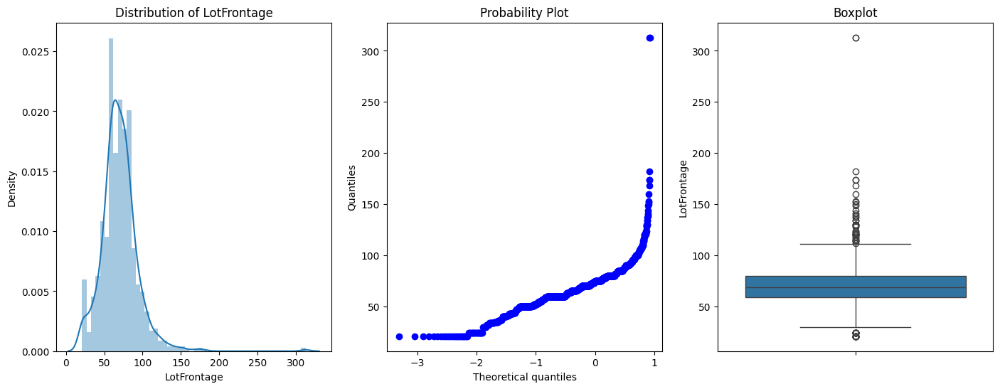


LotArea doesnt looks Gaussian



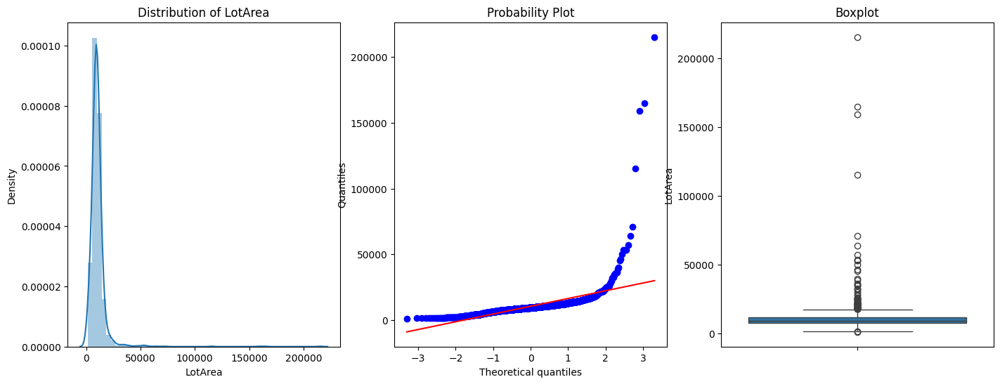


YearBuilt doesnt looks Gaussian



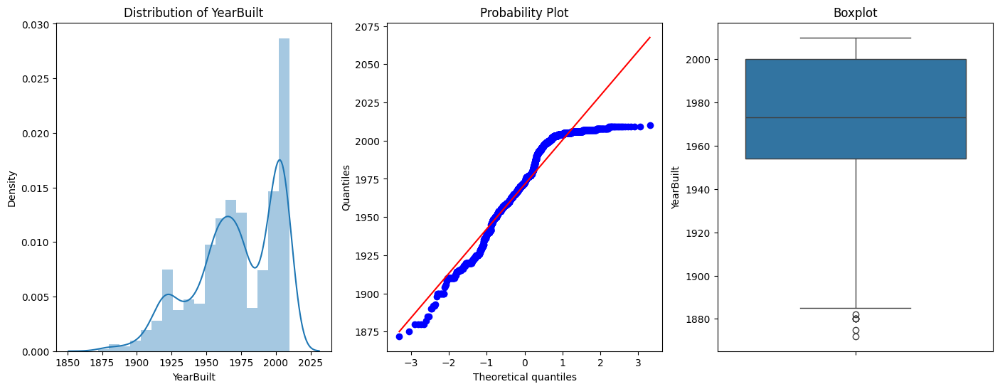


YearRemodAdd doesnt looks Gaussian



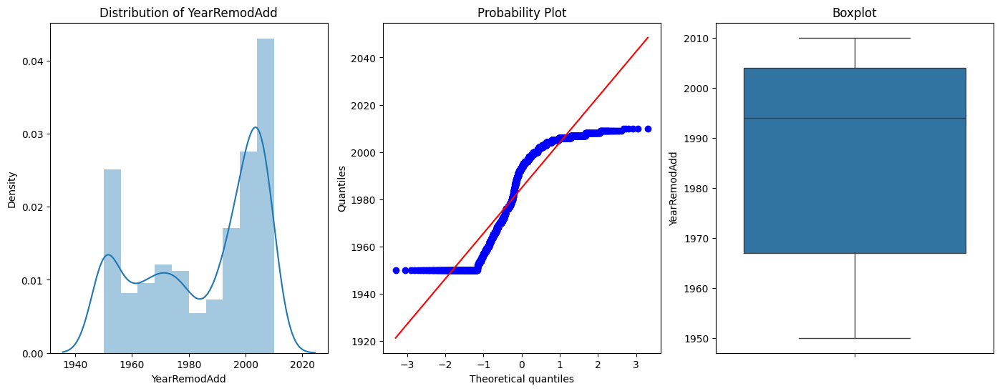


MasVnrArea looks Gaussian (fail to reject H0)



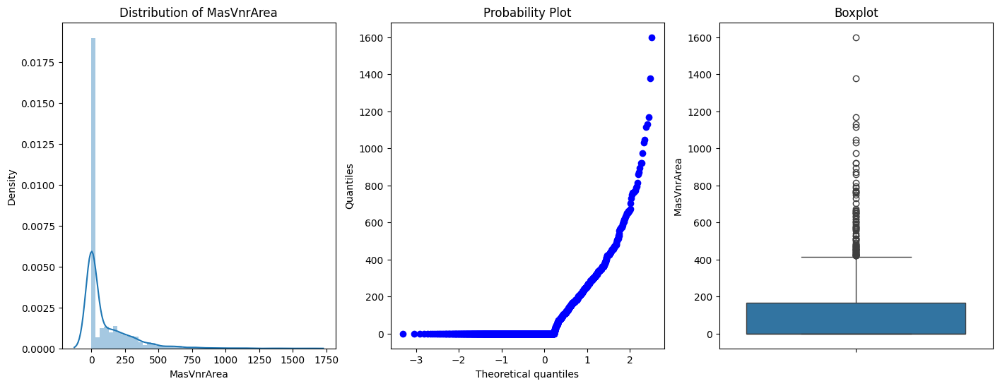


BsmtFinSF1 doesnt looks Gaussian



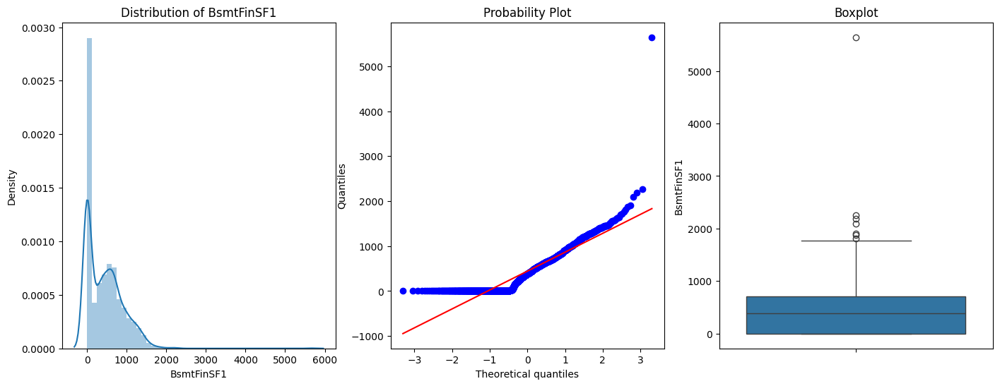


BsmtFinSF2 doesnt looks Gaussian



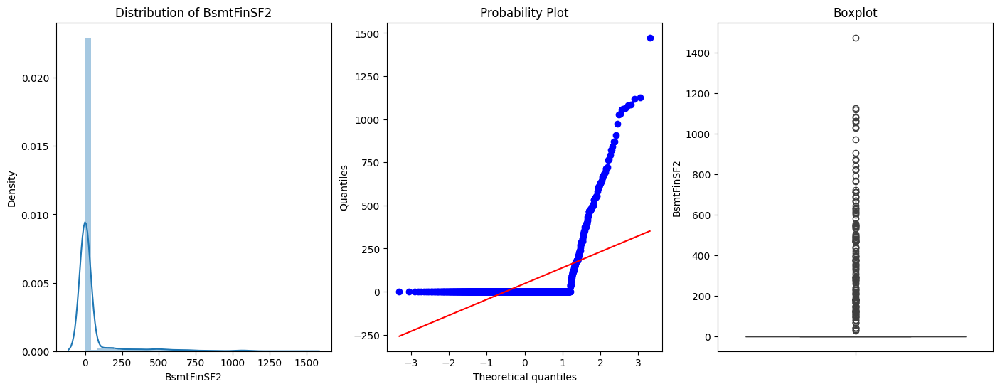


BsmtUnfSF doesnt looks Gaussian



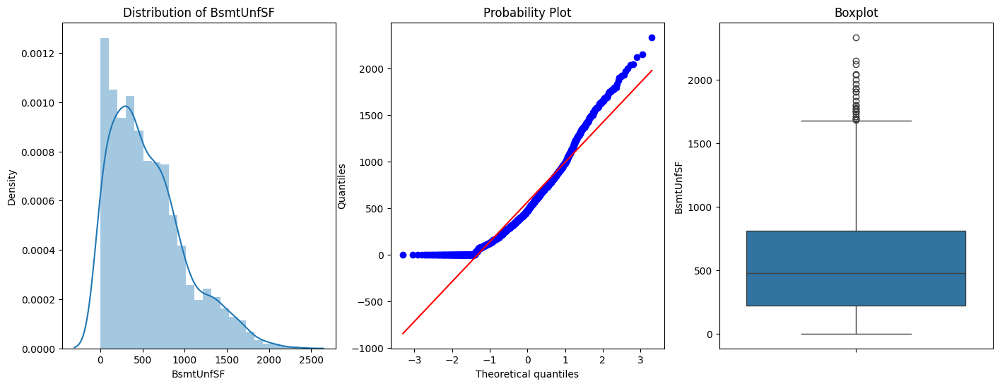


TotalBsmtSF doesnt looks Gaussian



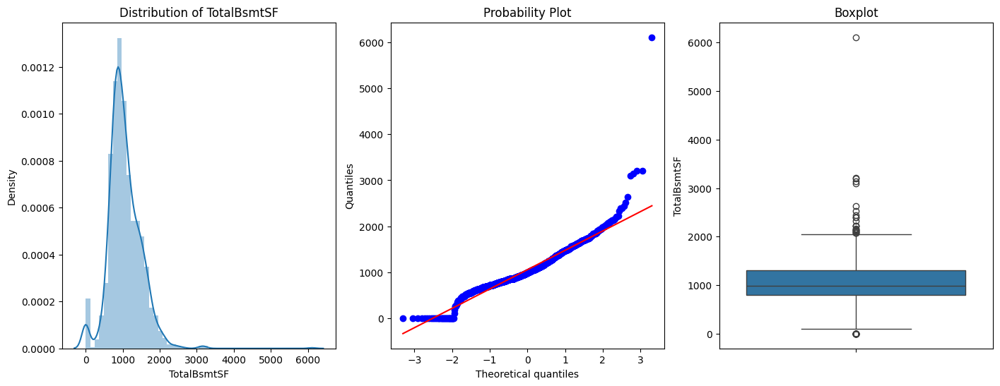


1stFlrSF doesnt looks Gaussian



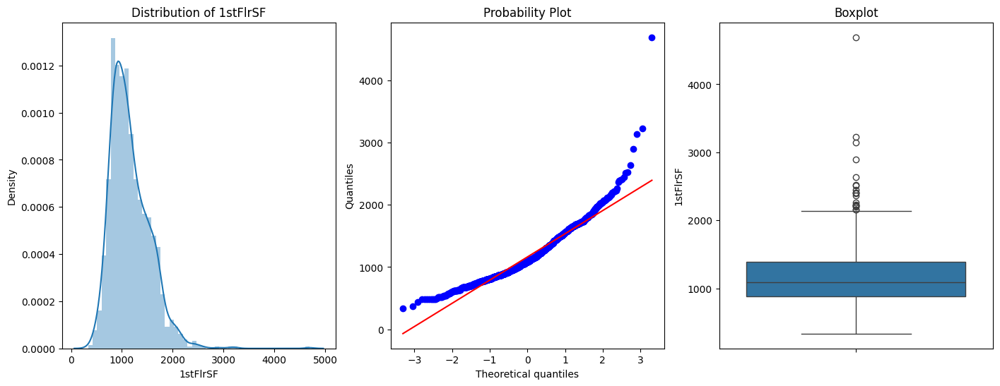


2ndFlrSF doesnt looks Gaussian



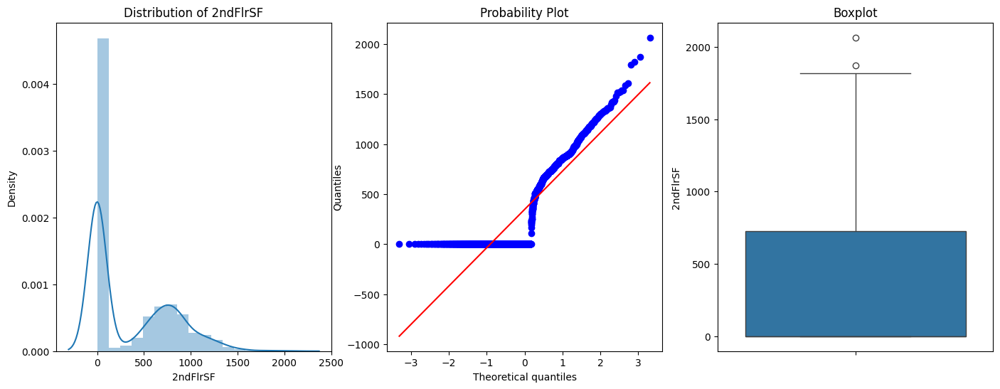


LowQualFinSF doesnt looks Gaussian



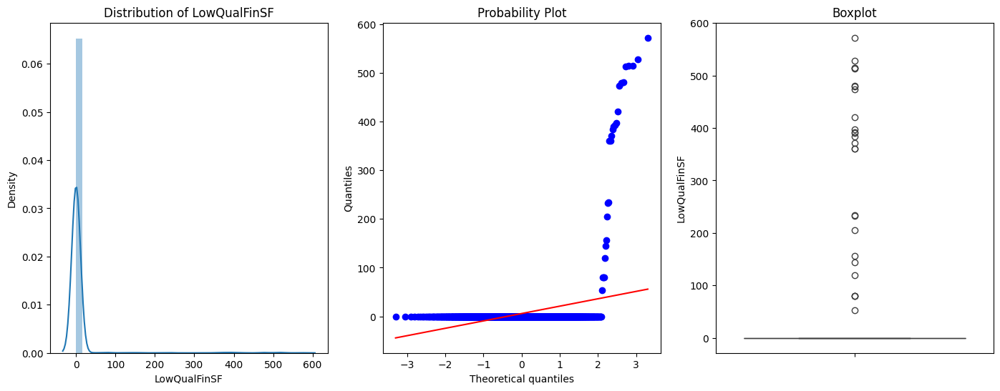


GrLivArea doesnt looks Gaussian



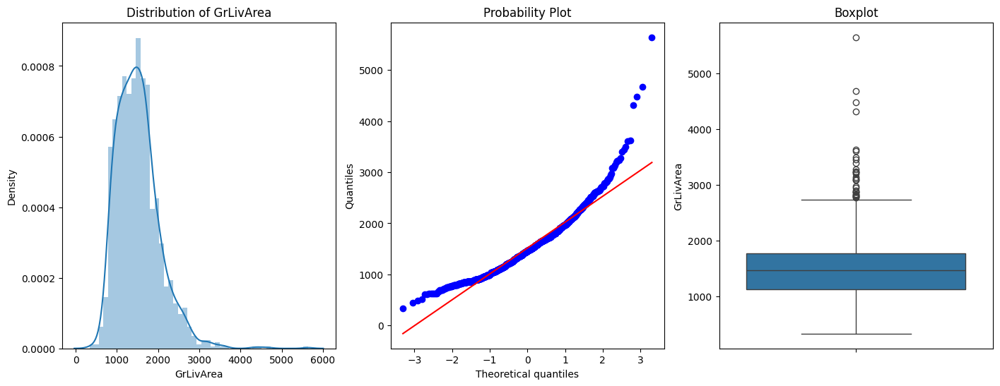


BsmtHalfBath doesnt looks Gaussian



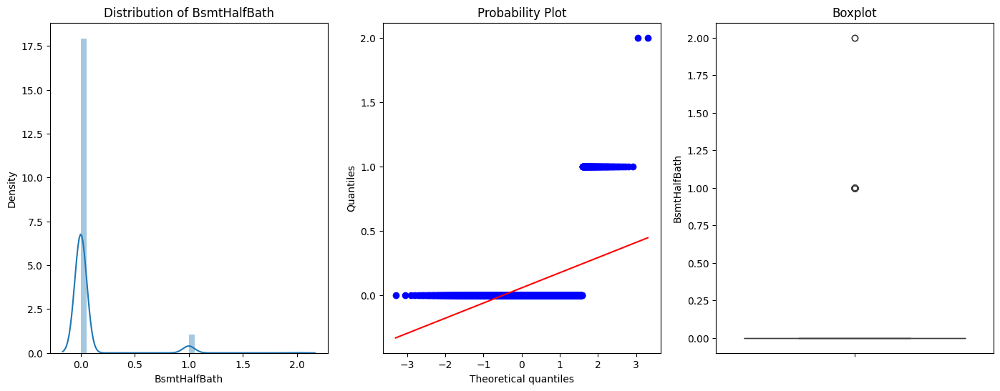


GarageYrBlt looks Gaussian (fail to reject H0)



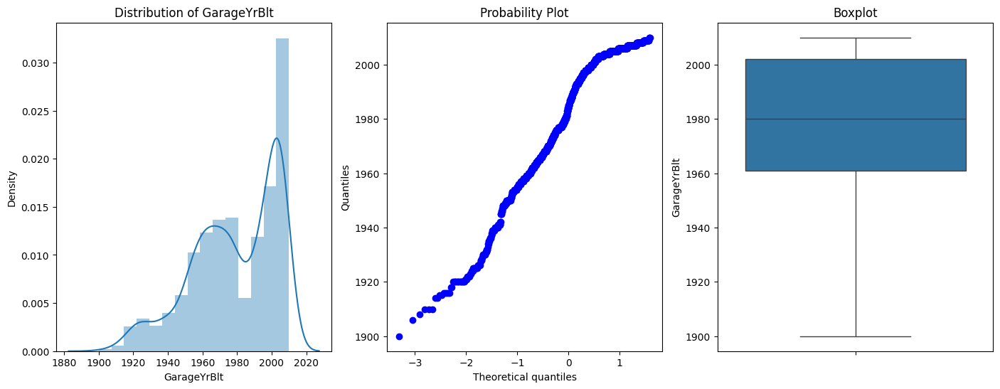


GarageArea doesnt looks Gaussian



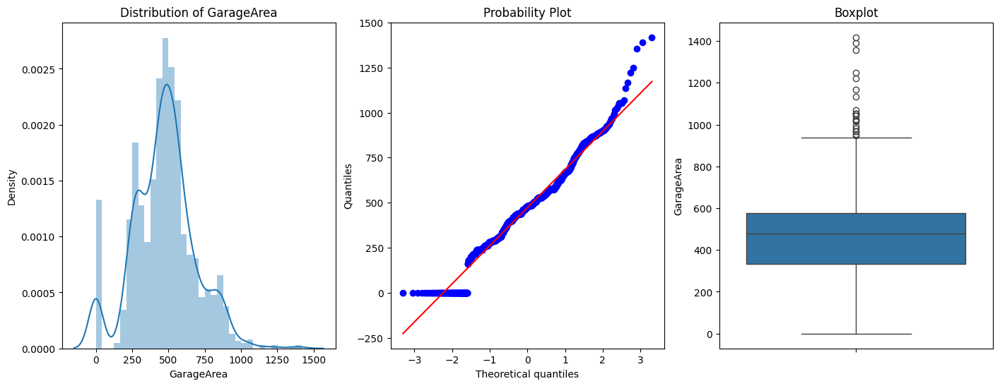


WoodDeckSF doesnt looks Gaussian



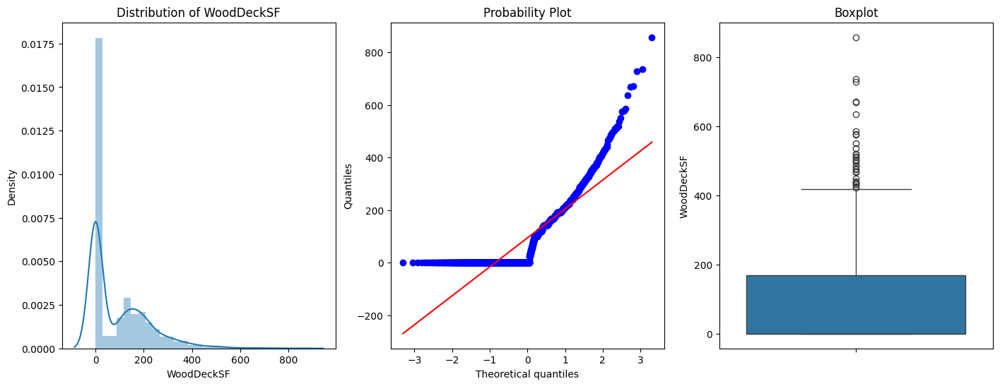


OpenPorchSF doesnt looks Gaussian



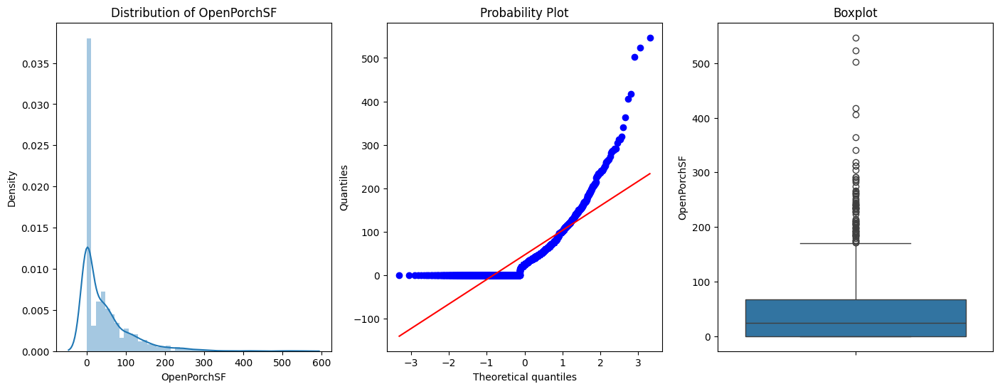


EnclosedPorch doesnt looks Gaussian



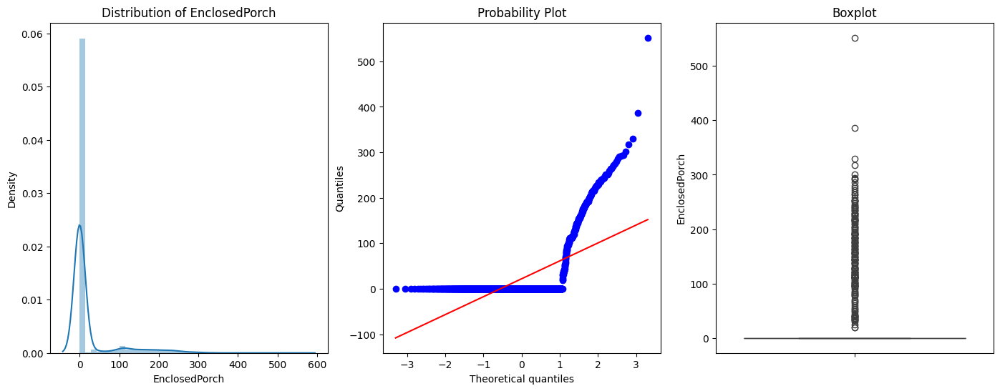


3SsnPorch doesnt looks Gaussian



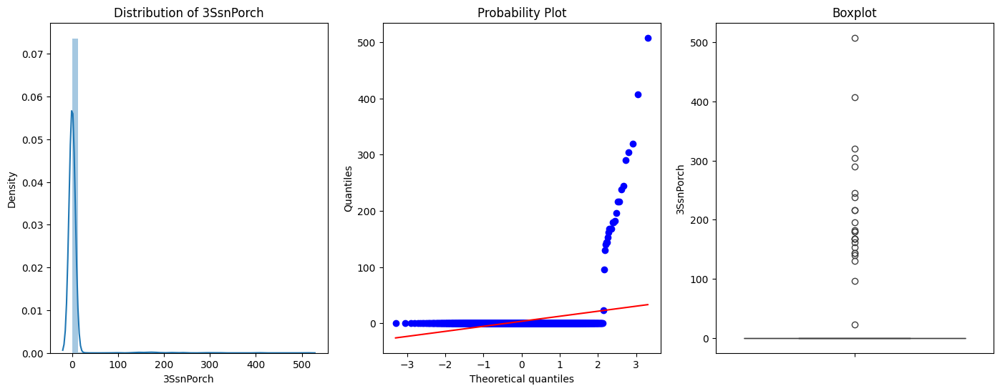


ScreenPorch doesnt looks Gaussian



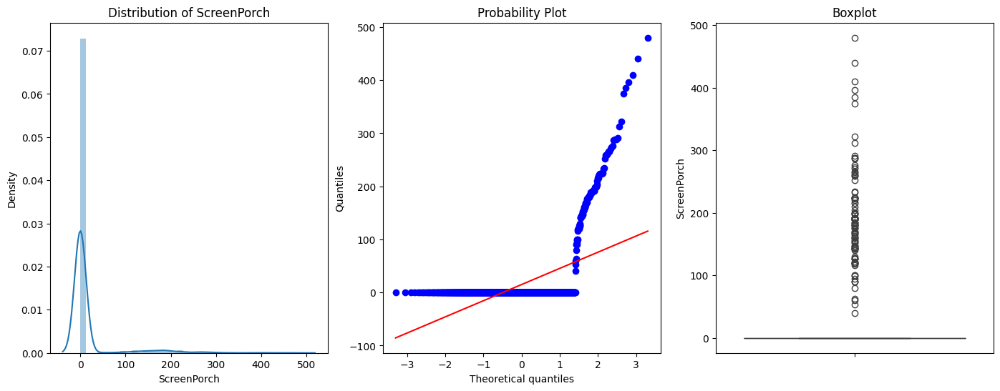


PoolArea doesnt looks Gaussian



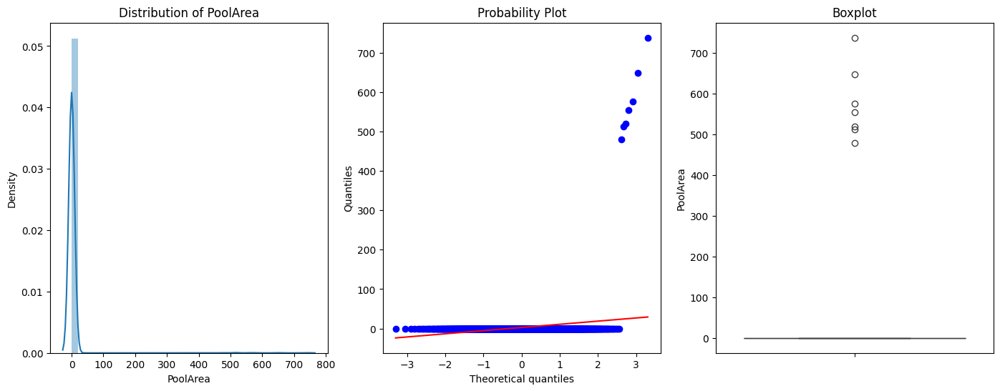


MiscVal doesnt looks Gaussian



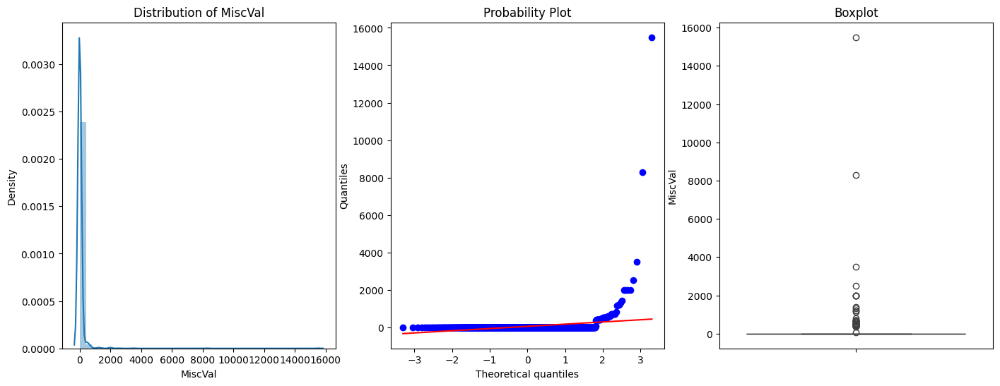


YrSold doesnt looks Gaussian



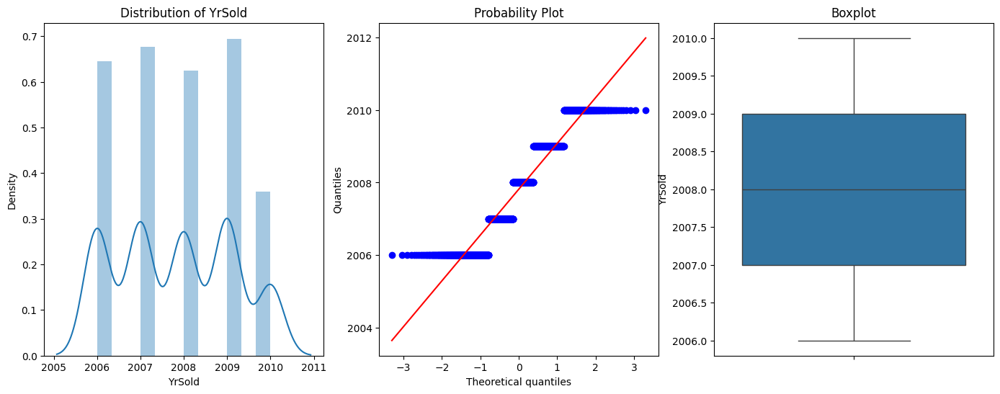


SalePrice doesnt looks Gaussian



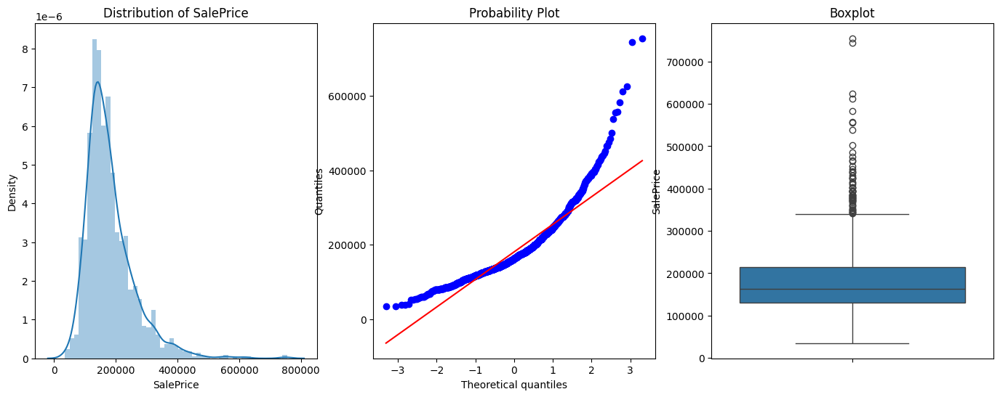

In [84]:
numeric_vars = tool.num_cols
alpha = 0.05
def diagnostic(df, var):

    stat, p_value = stats.shapiro(df[var])
    if p_value > alpha:
        print(f'\n{var} looks Gaussian (fail to reject H0)\n')
    else:
        print(f'\n{var} doesnt looks Gaussian\n')

    fig = plt.figure(figsize = (17, 6))
    plt.subplot(1,3,1)
    sns.distplot(df[var])
    plt.title("Distribution of {}".format(var))

    plt.subplot(1,3,2)
    stats.probplot(df[var], dist = "norm", plot = plt)
    plt.ylabel("Quantiles")

    plt.subplot(1,3,3)
    sns.boxplot(y = df[var])
    plt.title("Boxplot")
    plt.show()

for var in numeric_vars:
    diagnostic(train, var)



### The above code aims to visualize the distribution, normality, and presence of outliers for each numeric variable in a dataset.

- There are evidently 3 classes in the YearBuilt column i.e. very old, old, newly built households
- YearRemodAdd also sees 3 classes within it.

- We were able to segregate between categorical and numerical variables by looking at their distributions

In [85]:
target_col = 'SalePrice'

In [86]:
train[tool.num_cols].isnull().sum()[train[tool.num_cols].isnull().sum()!=0]

LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64

In [87]:
train[tool.other_cols].isnull().sum()[train[tool.other_cols].isnull().sum()!=0]

Alley           1369
MasVnrType       872
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

In [88]:
# Missing value treatment, keeping it simple as of now.

for col in train[tool.num_cols].isnull().sum()[train[tool.num_cols].isnull().sum()!=0].index:

    # Replacing with median here
    a = train[col].median()
    train[col].fillna(a, inplace = True)
    test[col].fillna(a, inplace = True)

for col in train[tool.other_cols].isnull().sum()[train[tool.other_cols].isnull().sum()!=0].index:

    # Replacing with mode here
    a = train[col].value_counts().index[0]
    train[col].fillna(a, inplace = True)
    test[col].fillna(a, inplace = True)

LotFrontage means there is a dependency between the samples with p_value:1.4469846007058767e-39 (reject the H0)


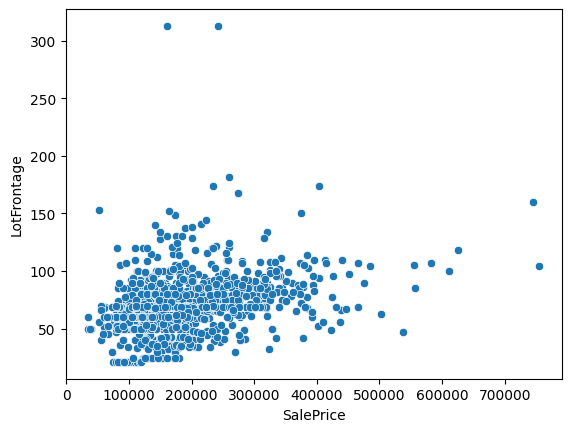

LotArea means there is a dependency between the samples with p_value:1.1231391549186823e-24 (reject the H0)


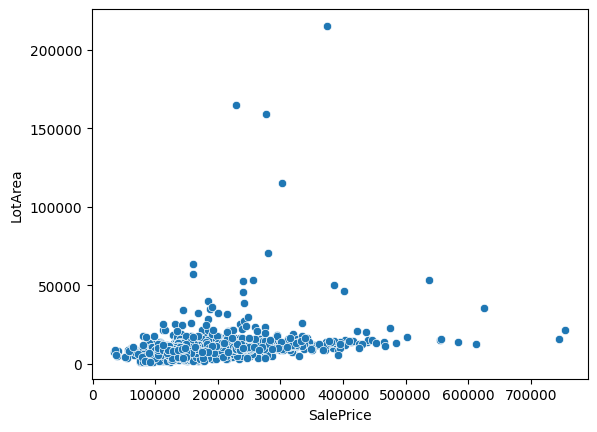

YearBuilt means there is a dependency between the samples with p_value:2.9902290990137165e-103 (reject the H0)


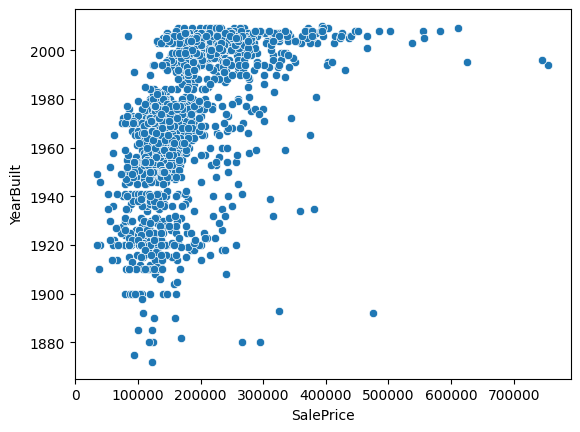

YearRemodAdd means there is a dependency between the samples with p_value:3.1649482419186587e-96 (reject the H0)


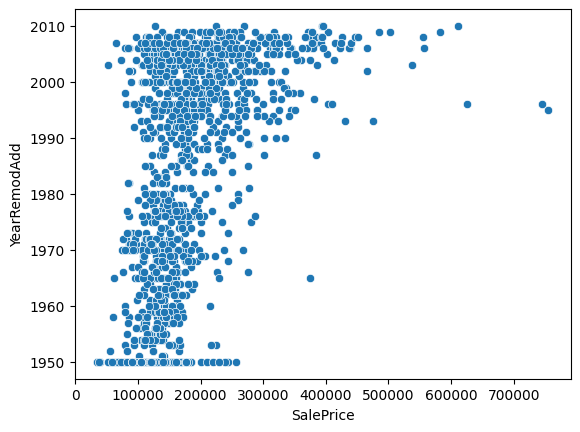

MasVnrArea means there is a dependency between the samples with p_value:4.1004610445367704e-82 (reject the H0)


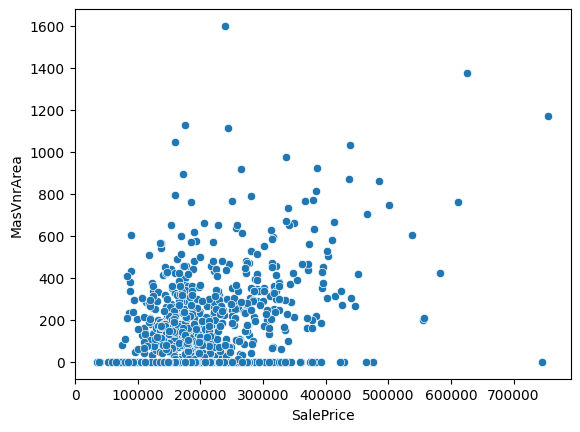

BsmtFinSF1 means there is a dependency between the samples with p_value:3.394109829288658e-53 (reject the H0)


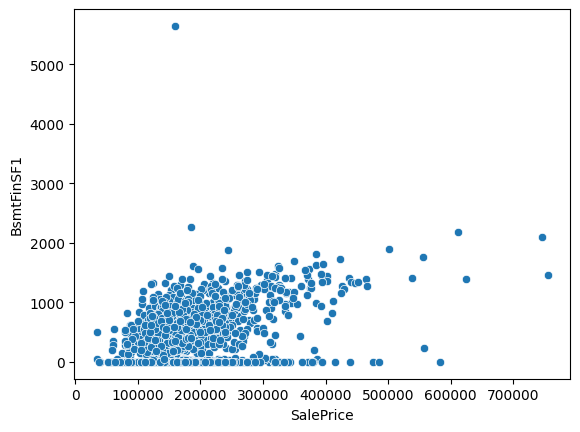

BsmtFinSF2 means both the samples are independent (fail to reject H0)
BsmtUnfSF means there is a dependency between the samples with p_value:1.182975796359376e-16 (reject the H0)


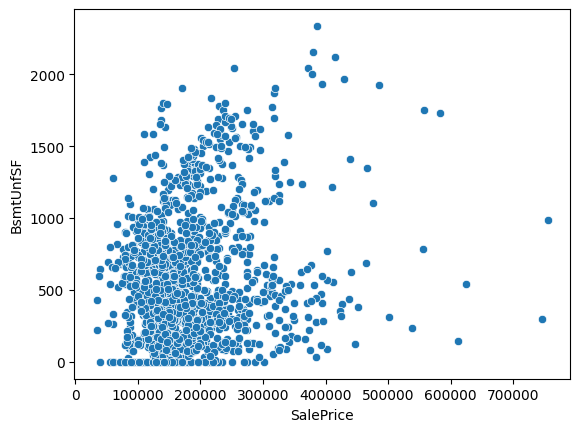

TotalBsmtSF means there is a dependency between the samples with p_value:9.484229391500708e-152 (reject the H0)


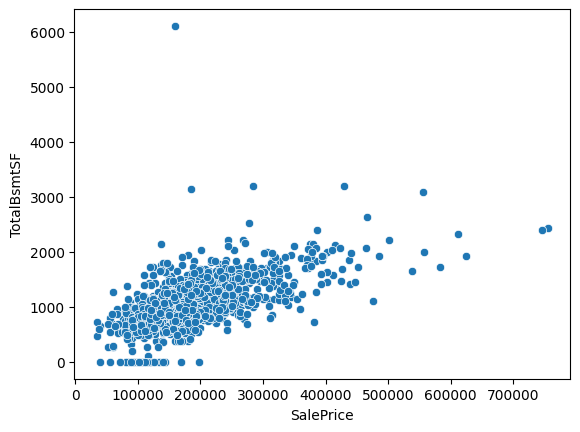

1stFlrSF means there is a dependency between the samples with p_value:5.394710618967361e-147 (reject the H0)


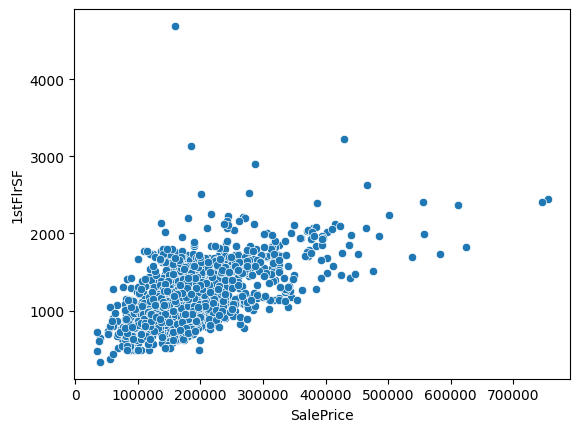

2ndFlrSF means there is a dependency between the samples with p_value:5.764335119178691e-36 (reject the H0)


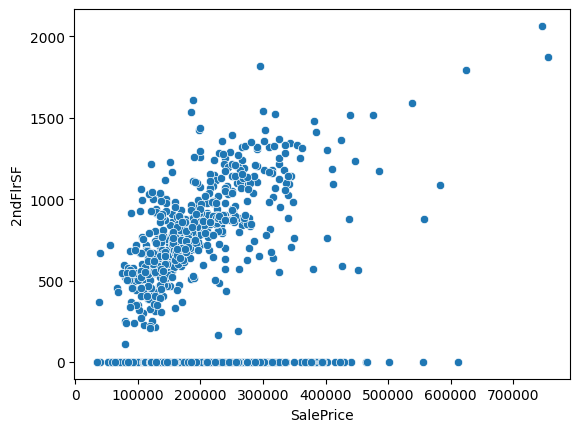

LowQualFinSF means both the samples are independent (fail to reject H0)
GrLivArea means there is a dependency between the samples with p_value:4.518033646776417e-223 (reject the H0)


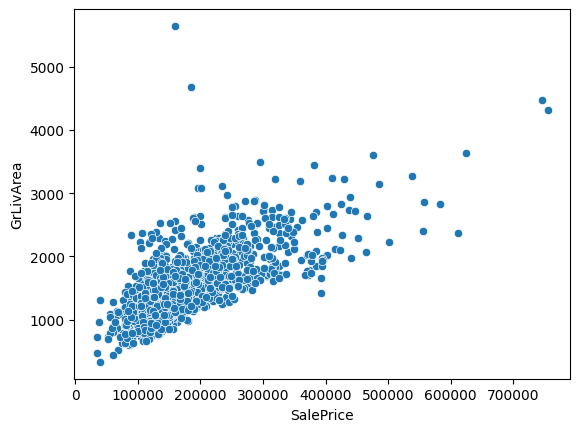

BsmtHalfBath means both the samples are independent (fail to reject H0)
GarageYrBlt means there is a dependency between the samples with p_value:7.155699874021235e-80 (reject the H0)


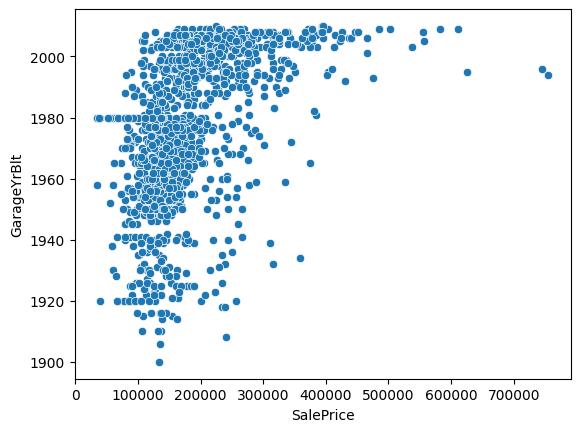

GarageArea means there is a dependency between the samples with p_value:5.2650381679755234e-158 (reject the H0)


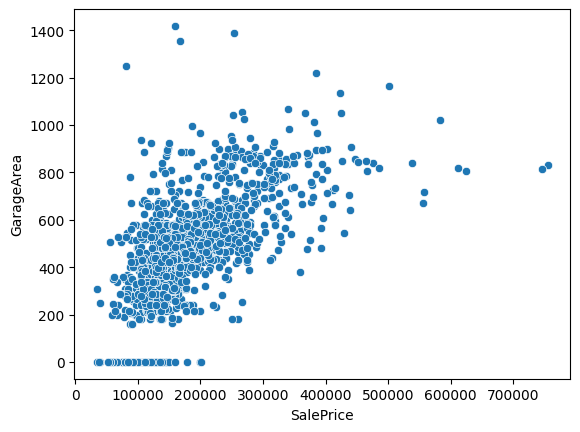

WoodDeckSF means there is a dependency between the samples with p_value:3.972216535626657e-37 (reject the H0)


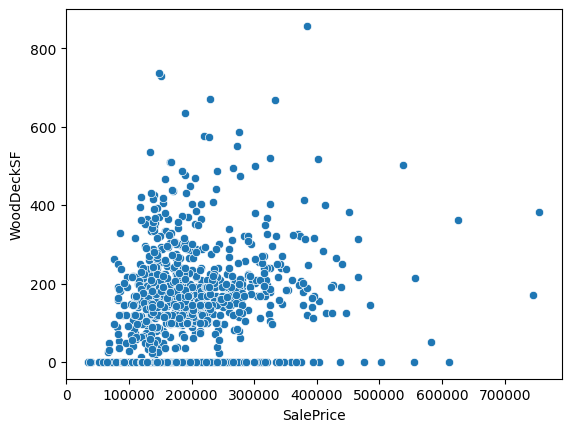

OpenPorchSF means there is a dependency between the samples with p_value:3.493373623095143e-35 (reject the H0)


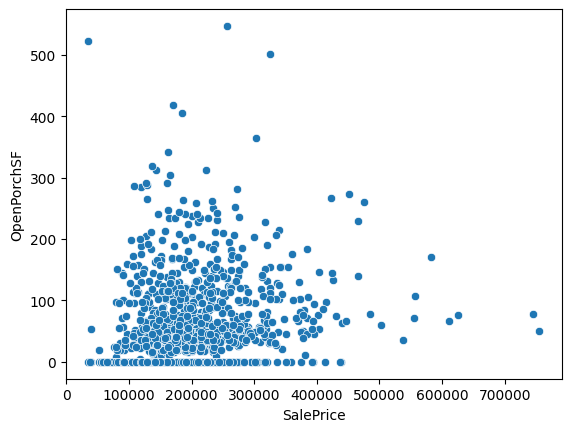

EnclosedPorch means there is a dependency between the samples with p_value:8.255770475113247e-07 (reject the H0)


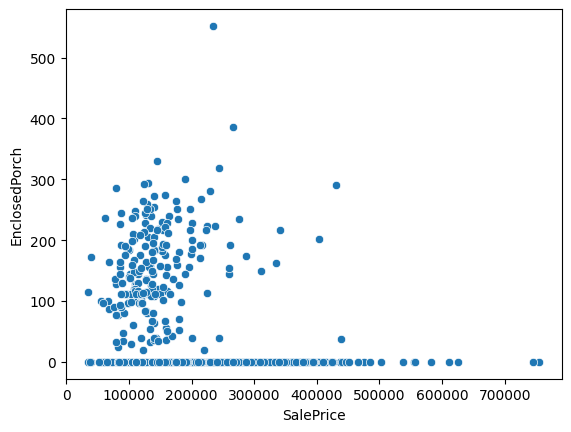

3SsnPorch means both the samples are independent (fail to reject H0)
ScreenPorch means there is a dependency between the samples with p_value:1.972140019468993e-05 (reject the H0)


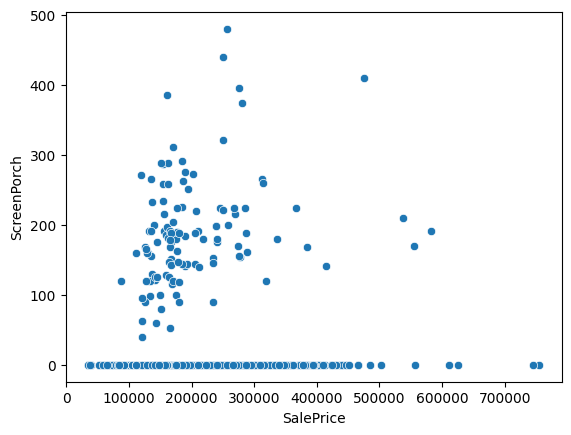

PoolArea means there is a dependency between the samples with p_value:0.00040734896011961866 (reject the H0)


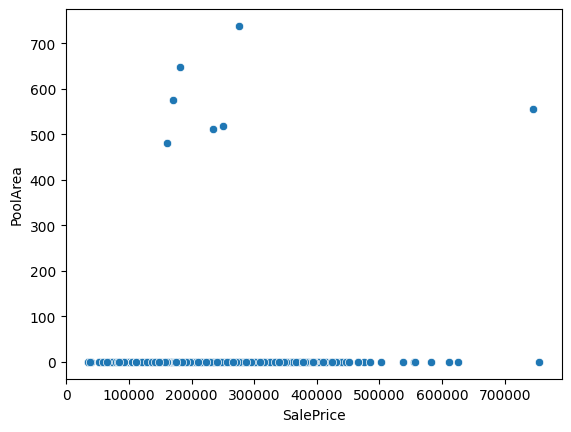

MiscVal means both the samples are independent (fail to reject H0)
YrSold means both the samples are independent (fail to reject H0)
SalePrice means there is a dependency between the samples with p_value:0.0 (reject the H0)


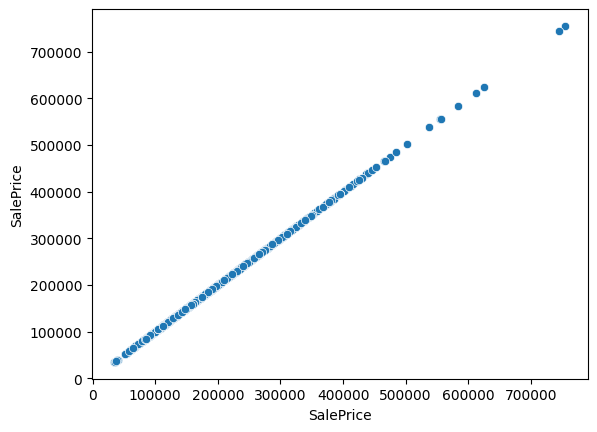

In [89]:
relavant_variables = []
for num_col in numeric_vars:
    stat, p_value = stats.pearsonr(train[num_col], train[target_col])
    if p_value > alpha:
        print(f'{num_col} means both the samples are independent (fail to reject H0)')
    else:
        print(f'{num_col} means there is a dependency between the samples with p_value:{p_value} (reject the H0)')
        relavant_variables.append(num_col)
        sns.scatterplot(data=train, x=target_col, y=num_col)
        plt.show()

stat=43.840, p=0.000
Probably some classes have different distributions with p_value: 8.817633866272648e-35


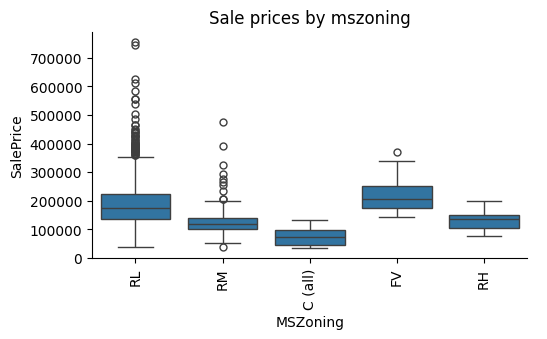

stat=2.459, p=0.117
Probably the same distribution
stat=1.116, p=0.291
Probably the same distribution
stat=40.133, p=0.000
Probably some classes have different distributions with p_value: 6.447523852011766e-25


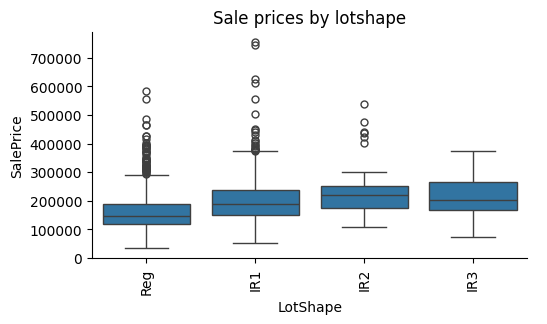

stat=12.850, p=0.000
Probably some classes have different distributions with p_value: 2.7422167521379096e-08


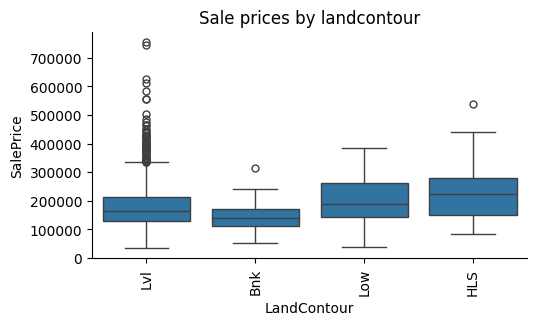

stat=0.299, p=0.585
Probably the same distribution
stat=7.810, p=0.000
Probably some classes have different distributions with p_value: 3.163167473604189e-06


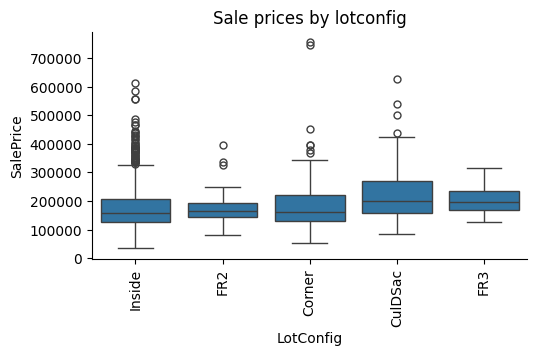

stat=1.959, p=0.141
Probably the same distribution
stat=71.785, p=0.000
Probably some classes have different distributions with p_value: 1.558600282771154e-225


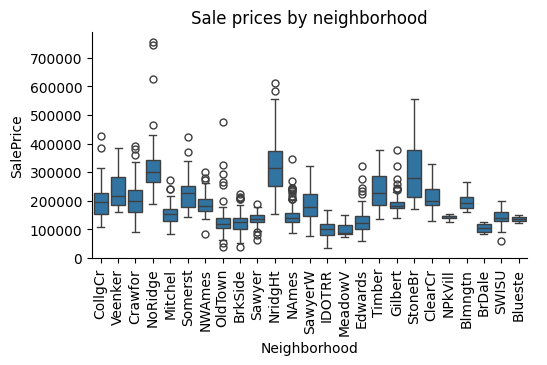

stat=6.118, p=0.000
Probably some classes have different distributions with p_value: 8.904549416138853e-08


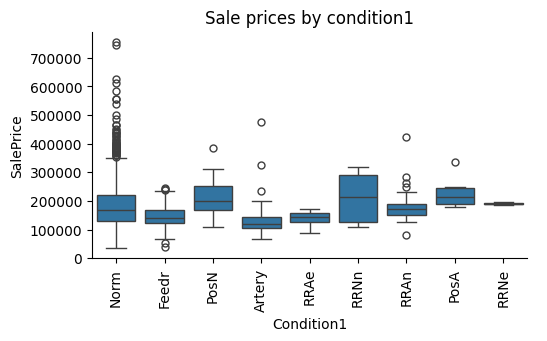

stat=2.074, p=0.043
Probably some classes have different distributions with p_value: 0.043425658360948464


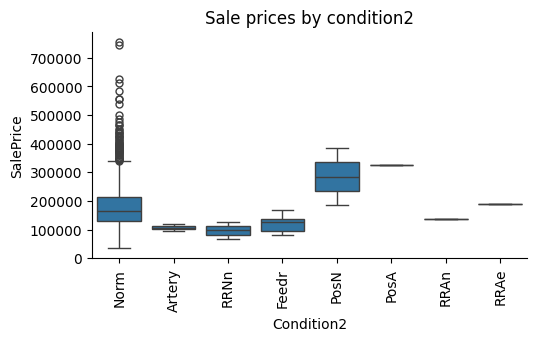

stat=13.011, p=0.000
Probably some classes have different distributions with p_value: 2.0567364604967015e-10


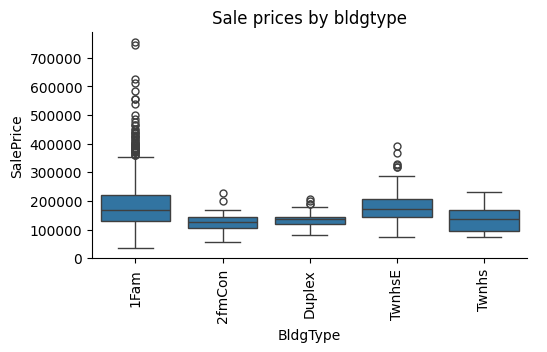

stat=19.595, p=0.000
Probably some classes have different distributions with p_value: 3.376776535121222e-25


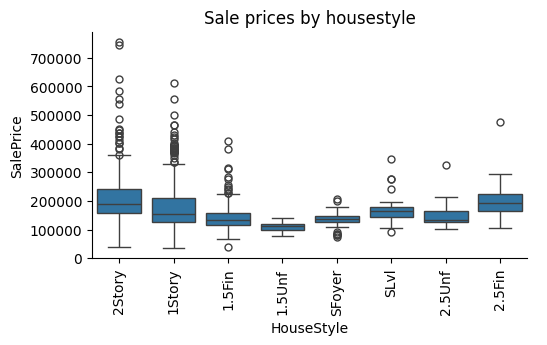

stat=17.805, p=0.000
Probably some classes have different distributions with p_value: 3.653523047099125e-17


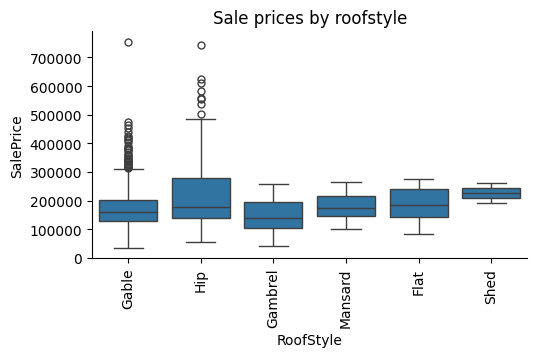

stat=6.727, p=0.000
Probably some classes have different distributions with p_value: 7.231444779987188e-08


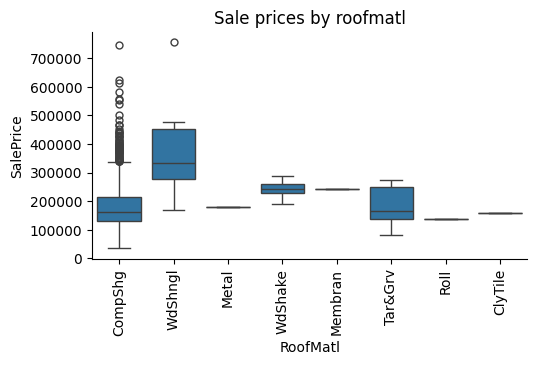

stat=18.612, p=0.000
Probably some classes have different distributions with p_value: 2.5860887286376316e-43


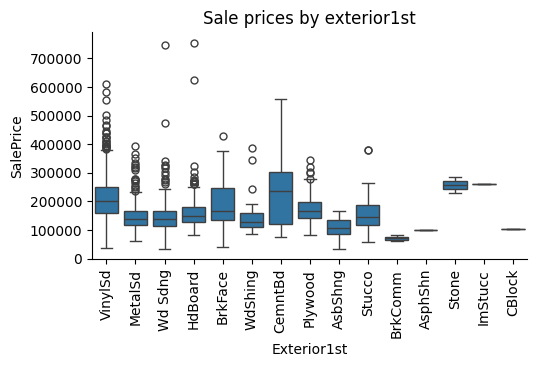

stat=17.501, p=0.000
Probably some classes have different distributions with p_value: 4.8421856706985465e-43


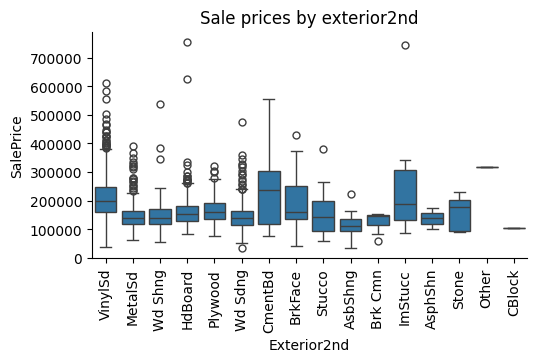

stat=90.378, p=0.000
Probably some classes have different distributions with p_value: 9.992113997549483e-38


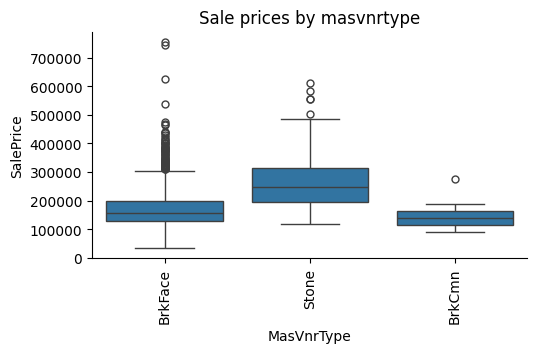

stat=443.335, p=0.000
Probably some classes have different distributions with p_value: 1.4395510967787893e-204


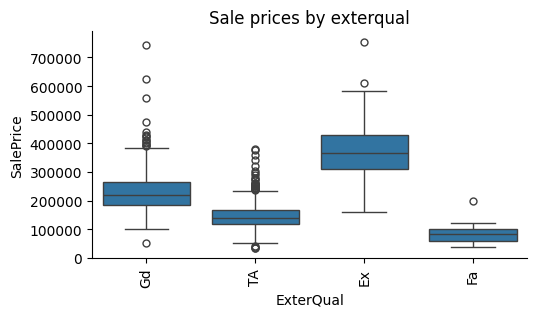

stat=8.799, p=0.000
Probably some classes have different distributions with p_value: 5.106680608671862e-07


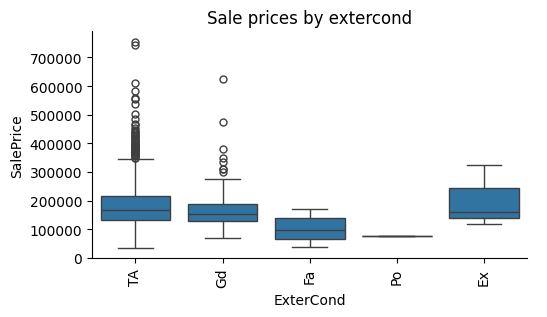

stat=100.254, p=0.000
Probably some classes have different distributions with p_value: 5.791895002232233e-91


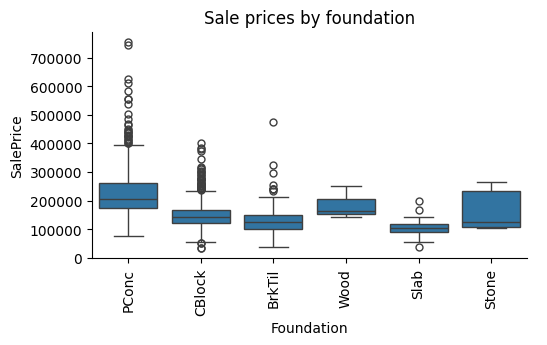

stat=413.946, p=0.000
Probably some classes have different distributions with p_value: 2.078120077126687e-194


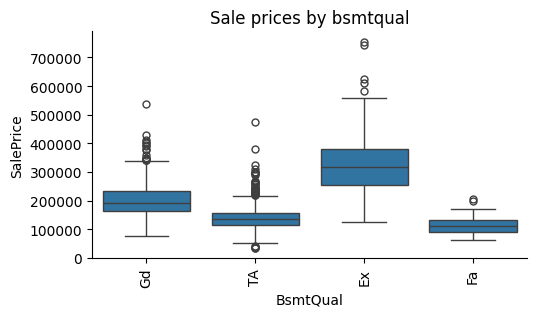

stat=13.792, p=0.000
Probably some classes have different distributions with p_value: 7.166577741866081e-09


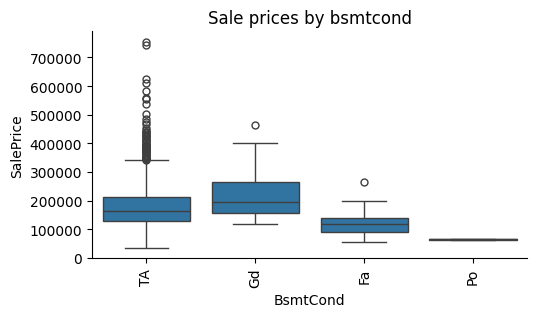

stat=76.578, p=0.000
Probably some classes have different distributions with p_value: 5.39423843153302e-46


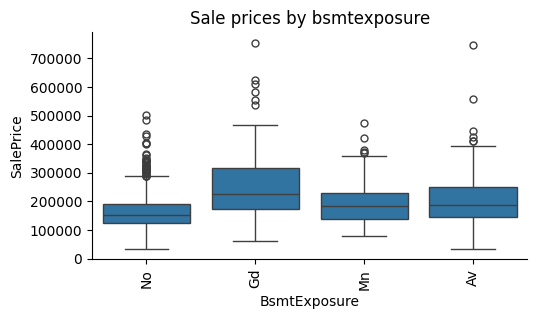

stat=70.518, p=0.000
Probably some classes have different distributions with p_value: 3.598398455129613e-66


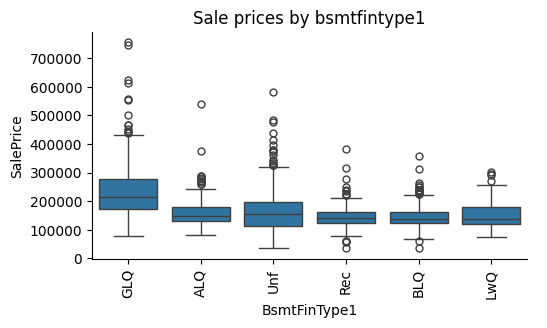

stat=2.390, p=0.036
Probably some classes have different distributions with p_value: 0.03599298669495113


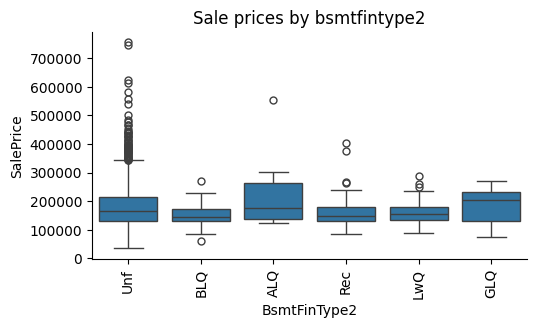

stat=4.260, p=0.001
Probably some classes have different distributions with p_value: 0.000753472106445497


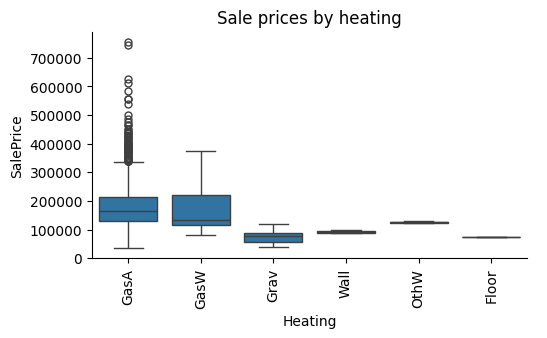

stat=88.394, p=0.000
Probably some classes have different distributions with p_value: 2.667062092104357e-67


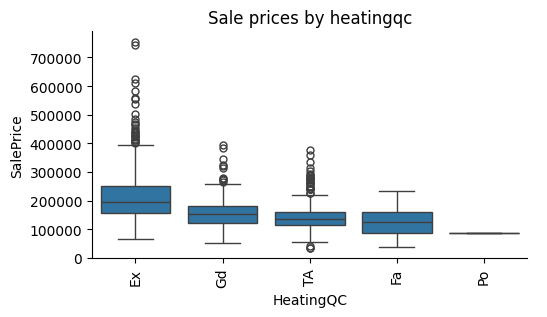

stat=98.305, p=0.000
Probably some classes have different distributions with p_value: 1.8095061559267854e-22


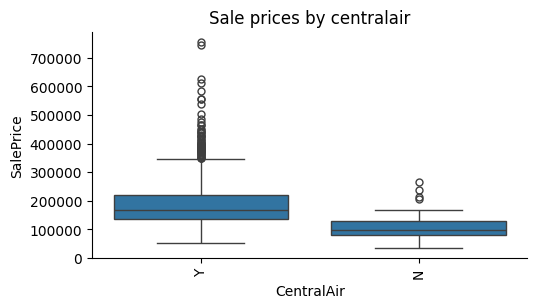

stat=23.074, p=0.000
Probably some classes have different distributions with p_value: 1.6412076757769925e-18


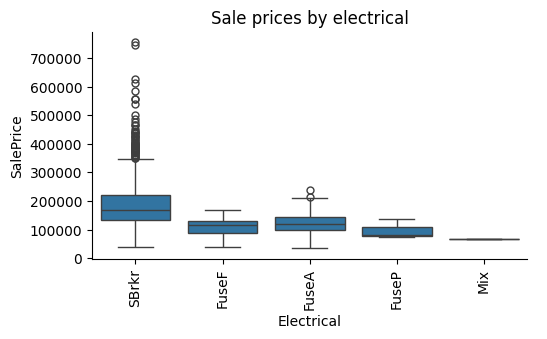

stat=407.806, p=0.000
Probably some classes have different distributions with p_value: 3.0322127528400614e-192


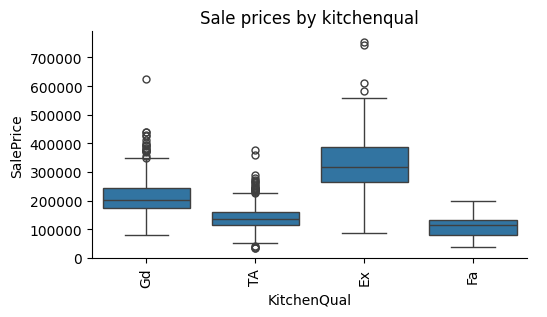

stat=4.058, p=0.000
Probably some classes have different distributions with p_value: 0.0004841696801078294


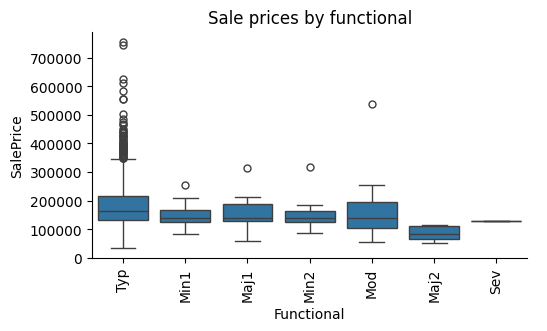

stat=41.134, p=0.000
Probably some classes have different distributions with p_value: 1.0611469709006871e-32


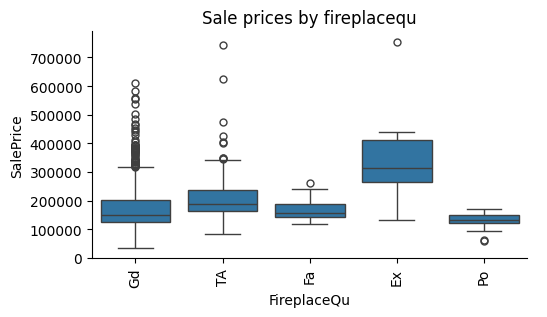

stat=59.313, p=0.000
Probably some classes have different distributions with p_value: 2.578442945744067e-56


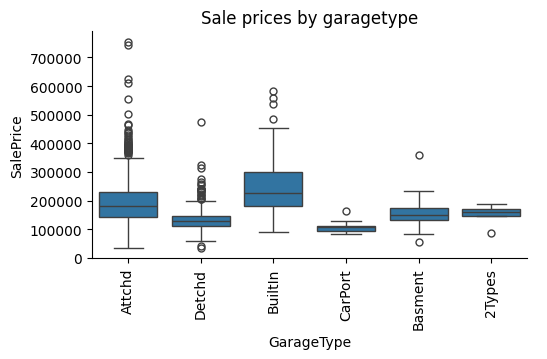

stat=303.619, p=0.000
Probably some classes have different distributions with p_value: 5.99331922426961e-111


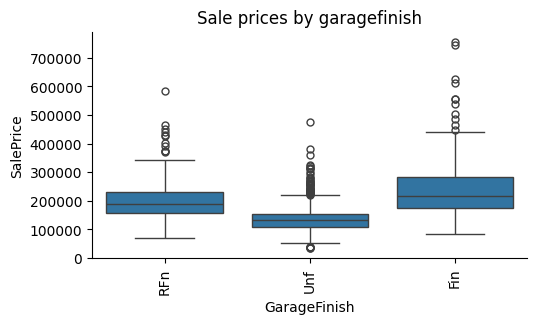

stat=8.458, p=0.000
Probably some classes have different distributions with p_value: 9.588016104813055e-07


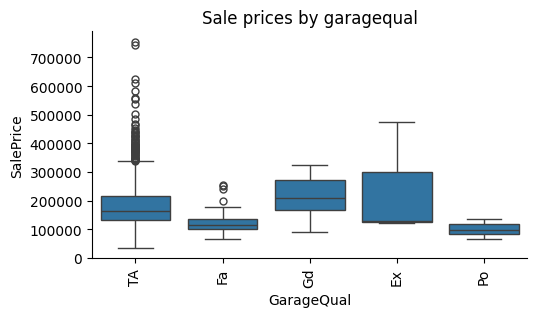

stat=8.203, p=0.000
Probably some classes have different distributions with p_value: 1.5322787250522445e-06


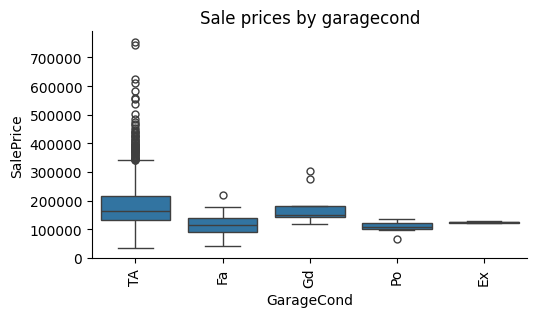

stat=42.024, p=0.000
Probably some classes have different distributions with p_value: 1.803568890651533e-18


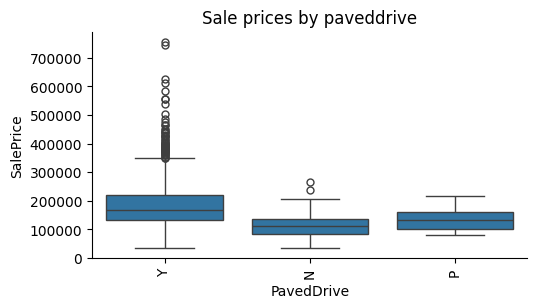

stat=15.660, p=0.000
Probably some classes have different distributions with p_value: 1.865657491861625e-07


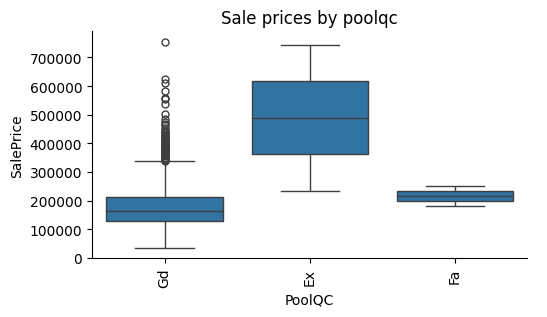

stat=6.347, p=0.000
Probably some classes have different distributions with p_value: 0.00028339828396272733


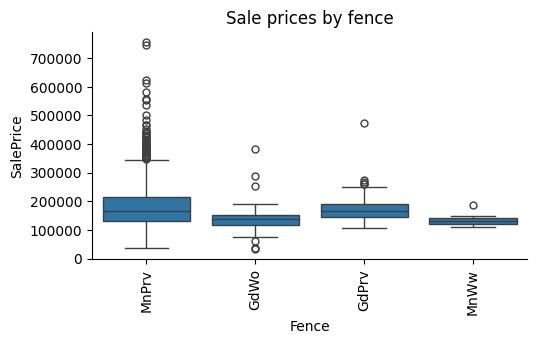

stat=1.062, p=0.364
Probably the same distribution
stat=28.863, p=0.000
Probably some classes have different distributions with p_value: 5.039766889462451e-42


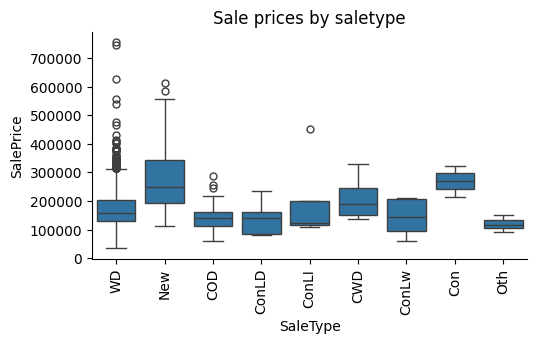

stat=45.578, p=0.000
Probably some classes have different distributions with p_value: 7.988268404991176e-44


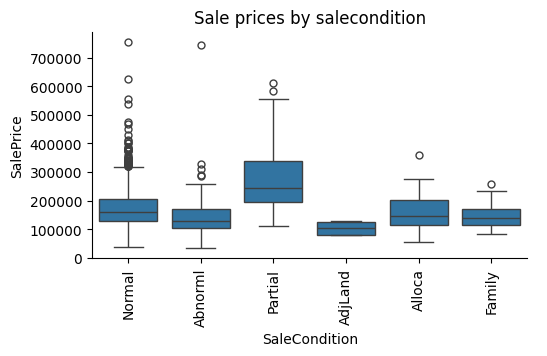

stat=33.732, p=0.000
Probably some classes have different distributions with p_value: 8.66216626609302e-79


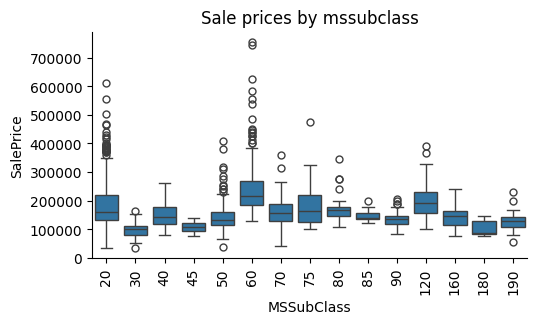

stat=349.027, p=0.000
Probably some classes have different distributions with p_value: 0.0


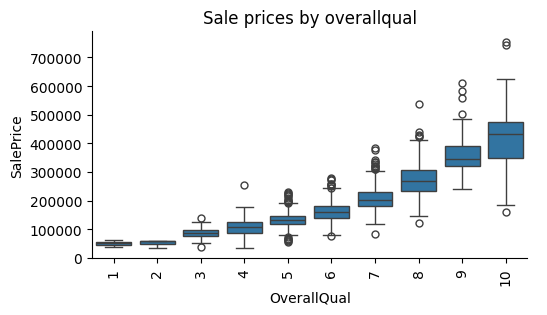

stat=26.003, p=0.000
Probably some classes have different distributions with p_value: 7.962288819950615e-38


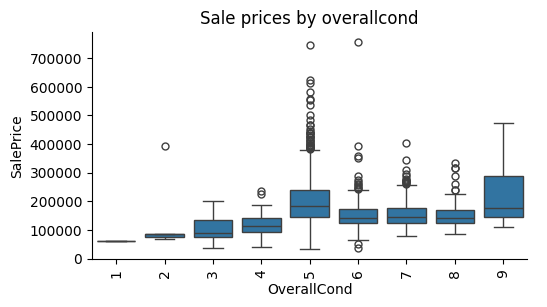

stat=27.448, p=0.000
Probably some classes have different distributions with p_value: 2.88243552729416e-17


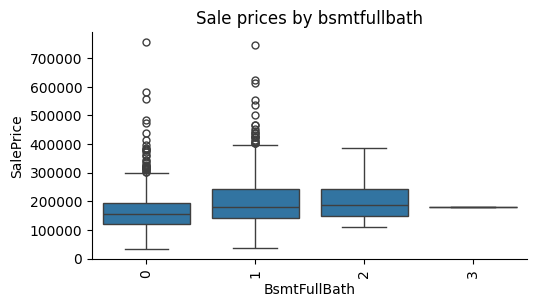

stat=246.067, p=0.000
Probably some classes have different distributions with p_value: 3.8021879324489406e-129


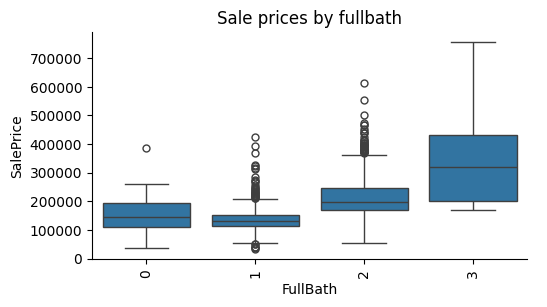

stat=74.470, p=0.000
Probably some classes have different distributions with p_value: 1.6091449454034875e-31


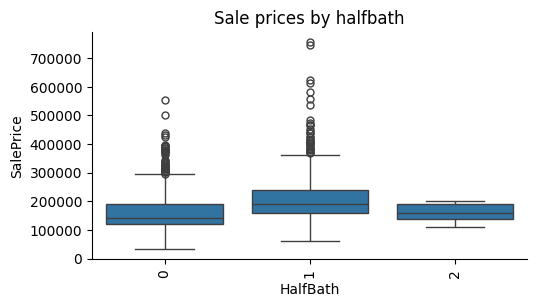

stat=12.925, p=0.000
Probably some classes have different distributions with p_value: 3.3043196450461637e-16


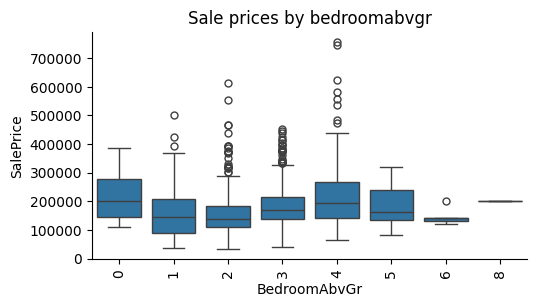

stat=9.836, p=0.000
Probably some classes have different distributions with p_value: 2.011735142857873e-06


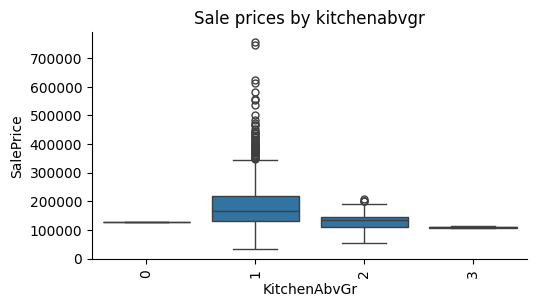

stat=56.164, p=0.000
Probably some classes have different distributions with p_value: 1.1917103366526644e-103


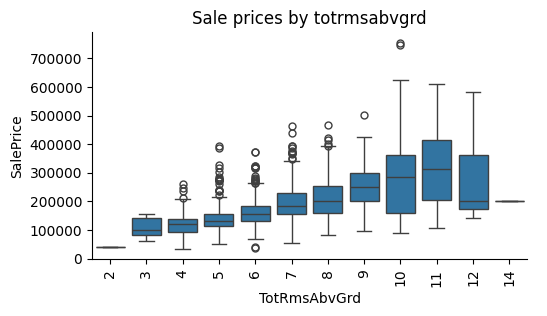

stat=146.741, p=0.000
Probably some classes have different distributions with p_value: 4.4210010307257784e-83


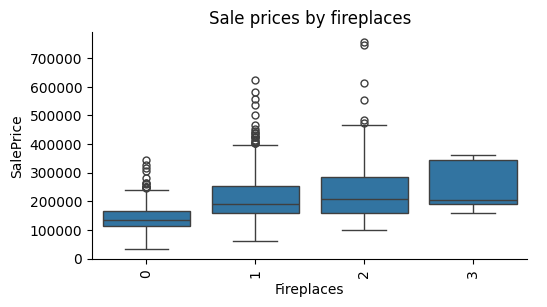

stat=351.207, p=0.000
Probably some classes have different distributions with p_value: 1.1211287650612485e-211


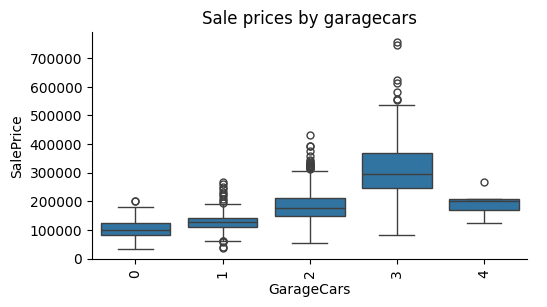

stat=0.958, p=0.483
Probably the same distribution


In [90]:
from scipy.stats import f_oneway


for cat_col in tool.other_cols:
  data_list = [train.loc[train[cat_col]==cat_class, target_col] for cat_class in train[cat_col].unique()]
  stat, p = stats.f_oneway(*data_list)

  print('stat=%.3f, p=%.3f' % (stat, p))

  if p > 0.05:
    print('Probably the same distribution')
  else:
    print(f'Probably some classes have different distributions with p_value: {p}')
    relavant_variables.append(cat_col)
    sns.catplot(x = cat_col,
                y = "SalePrice",
                kind = "box",
                height = 3,
                aspect = 1.8,
                data = train).set(title = f"Sale prices by {cat_col.lower()}")
    plt.xticks(rotation=90)
    plt.show()



  #

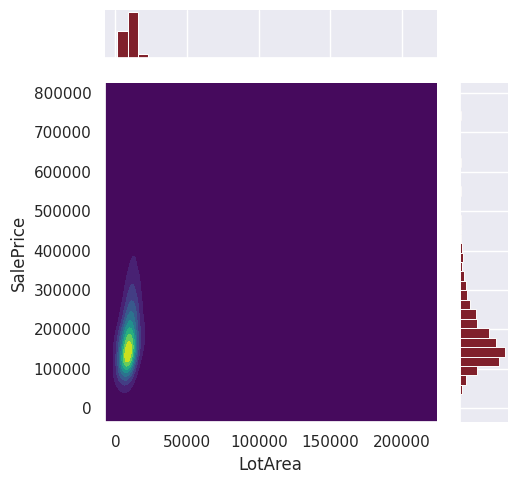

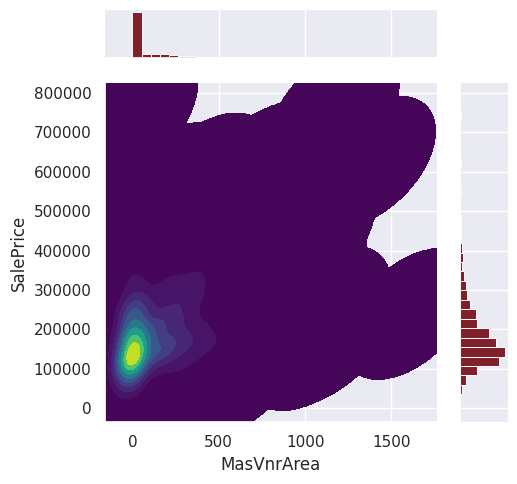

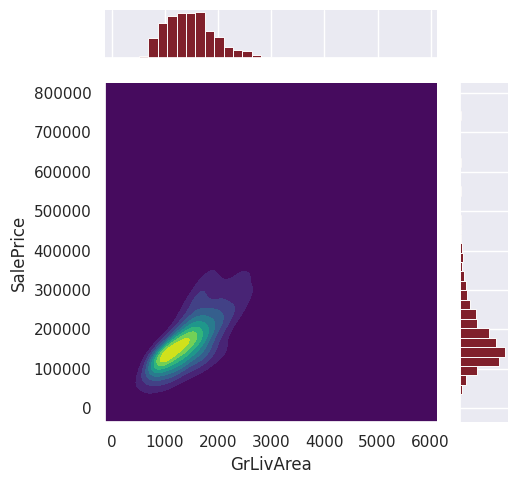

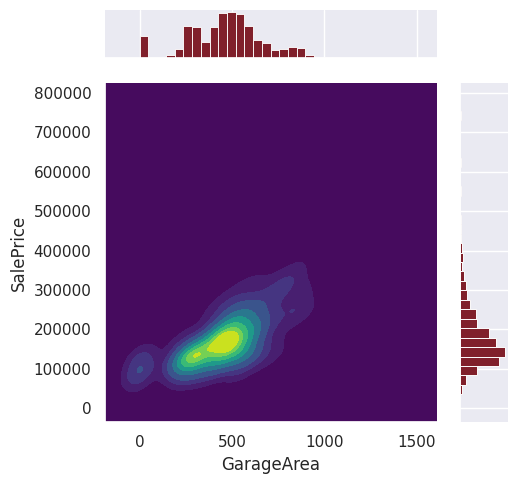

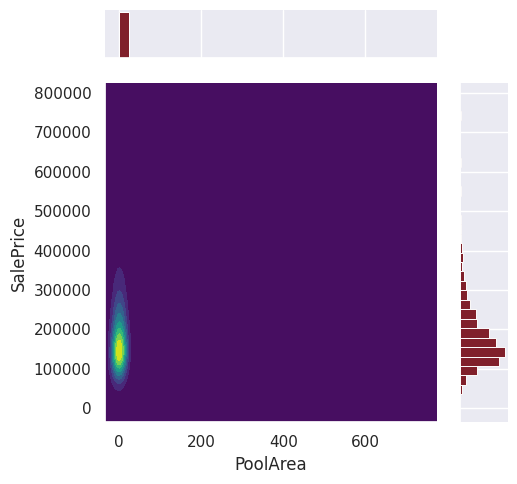

In [94]:
for col in tool.num_cols:
  if 'area' in col.lower():
    sns.set_theme(style = "darkgrid")
    g = sns.JointGrid(data = train, height = 5, x = col, y = "SalePrice", space = 0.5)
    g.plot_joint(sns.kdeplot, fill = True, thresh = 0, cmap = "viridis")
    g.plot_marginals(sns.histplot, color = "#80202B", alpha = 1, bins = 30);

### Below things can be concluded:
- Houses with smaller lot areas, MasVnrArea, PoolArea have a certain range of price, after a limit of LotArea, SalePrice also increases.
- Houses with GrLivArea, GarageArea seems to grow with the increase in price, implying stronger correlation with the SalePrice.

In [95]:
tool.rel_cols = relavant_variables

In [105]:
tool.rel_num_cols = [i for i in tool.rel_cols if i in tool.num_cols]
tool.rel_num_cols.remove(target_col)
tool.rel_cat_cols = [i for i in tool.rel_cols if i not in tool.num_cols]

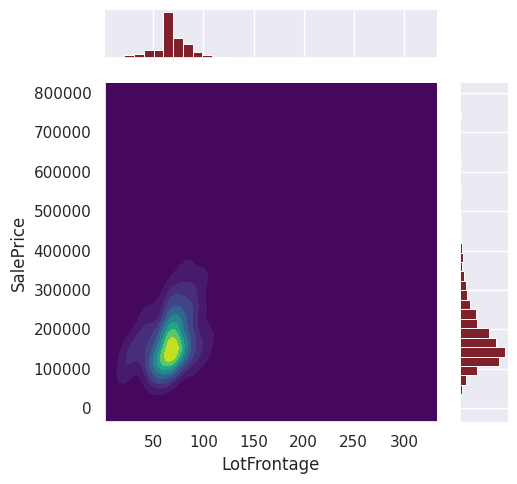

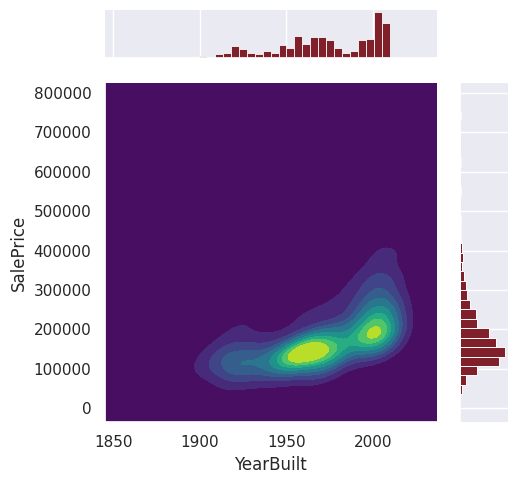

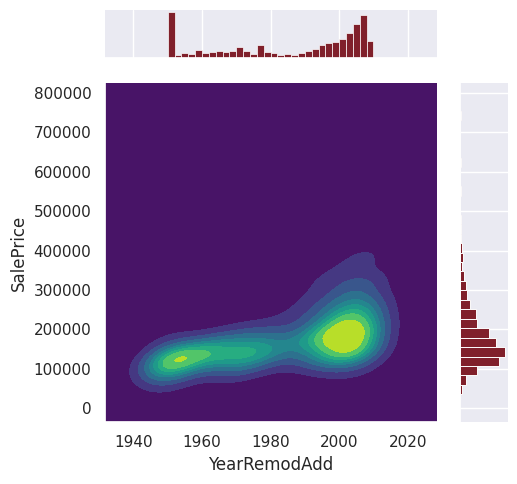

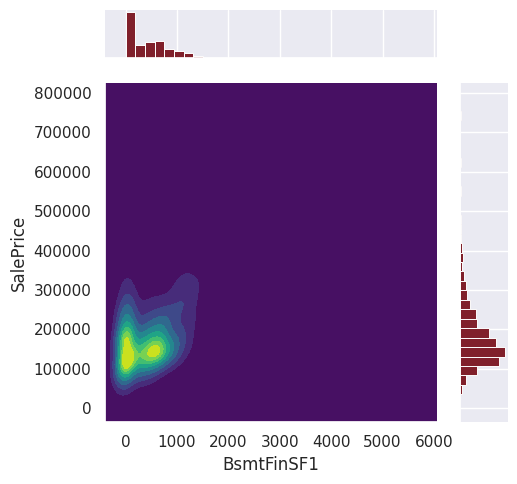

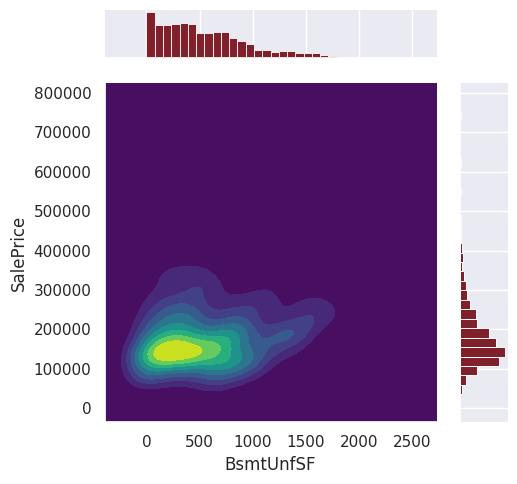

...

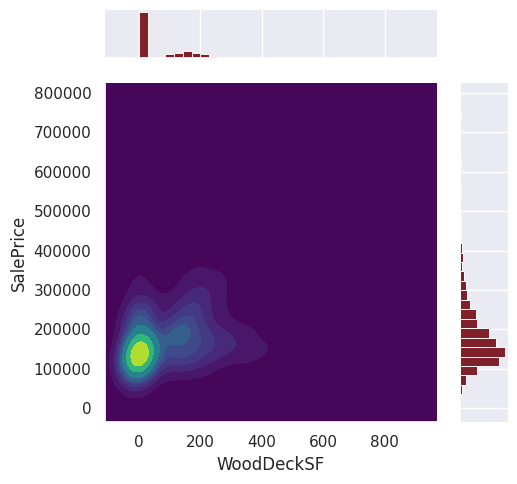

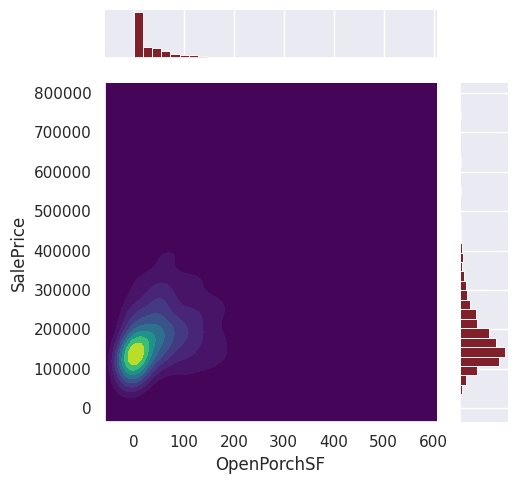

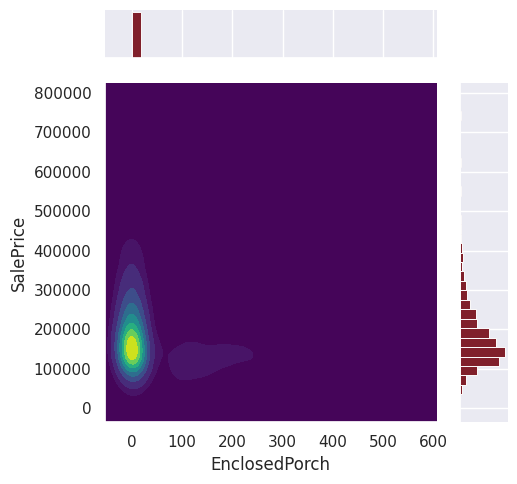

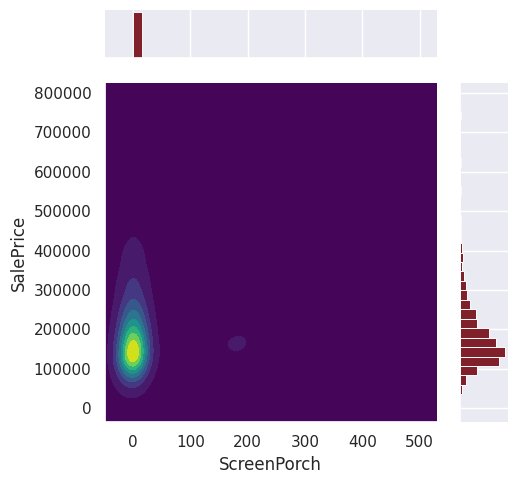

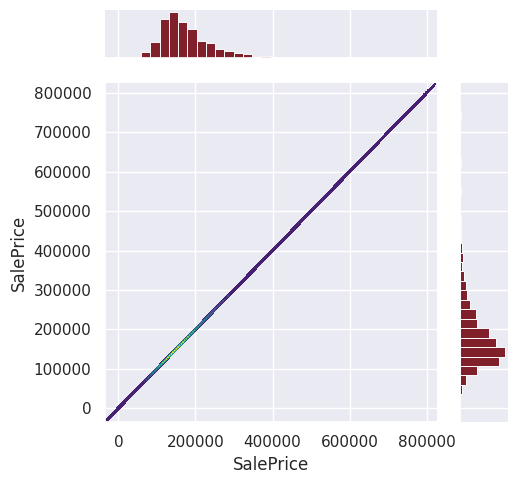

In [104]:
for rel_num in tool.rel_num_cols:
  if 'area' not in rel_num.lower():
    sns.set_theme(style = "darkgrid")
    g = sns.JointGrid(data = train, height = 5, x = rel_num, y = "SalePrice", space = 0.5)
    g.plot_joint(sns.kdeplot, fill = True, thresh = 0, cmap = "viridis")
    g.plot_marginals(sns.histplot, color = "#80202B", alpha = 1, bins = 30)
    plt.show()


#### The histogram to the right indicates that most houses are sold within a particular price range, which decreases as prices increase, suggesting a right-skewed distribution.

### houses with paved streets have a higher likelihood of reaching higher sale prices compared to houses with gravel streets.

In [109]:
fig = px.ecdf(train, x = "SalePrice", log_x = True, log_y = True,
              color = "GarageCars", height = 400, width = 700)
fig.show()

###  the number of cars that a garage can hold is a major indicator of the house's sale price, with larger garages have higher sale prices.

In [ ]:
fig = px.ecdf(train, x = "SalePrice", log_x = True, log_y = True,
              color = "Heating", height = 500, width = 800)
fig.show()

### gas forced air heating systems (GasA) being the most common in the dataset

In [110]:
fig = px.bar(train, x = "HouseStyle", y = "SalePrice", color = "SaleType",
             pattern_shape = "Street", pattern_shape_sequence=["x", "+"],
             text_auto = True, height = 400, width = 720)
fig.show()


'/content'

In [ ]:
fig = px.density_heatmap(train, x = "YearBuilt", y = "SalePrice", marginal_x = "rug",
                         marginal_y = "histogram", height = 500, width = 830, text_auto = True,
                         title = "Density heatmap between YearBuilt and SalePrice variables")
fig.show()

### spike in house construction around the year 2000 and confirms that while sale prices vary widely across different years

In [ ]:
fig = px.density_heatmap(train, x = "GrLivArea", y = "SalePrice", marginal_x = "rug",
                         marginal_y = "histogram", height = 400, width = 720, text_auto = True,
                         title = "Density heatmap between GrLivArea and SalePrice variables")
fig.show()

### there is a range of "GrLivArea" and "SalePrice" within the dataset, with a general trend that larger living areas tend to be associated with higher sale prices.

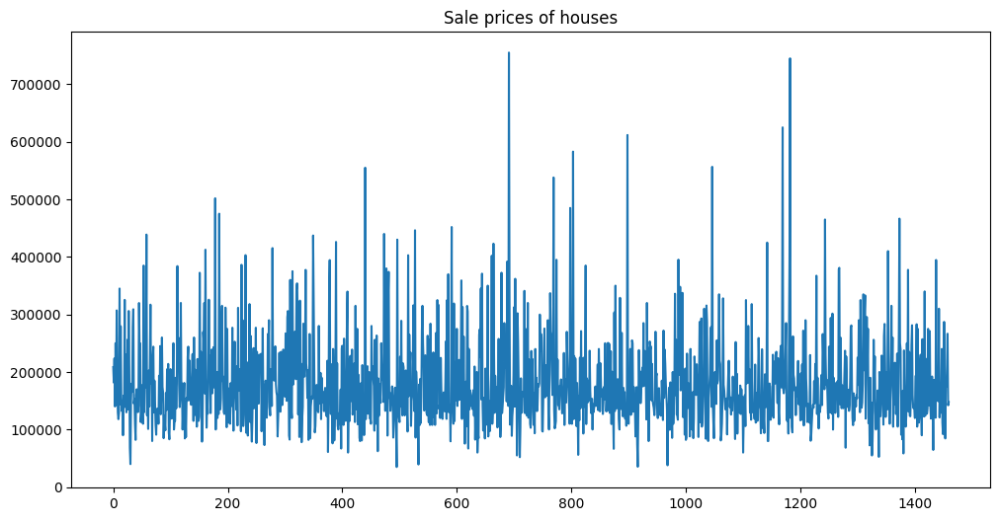

In [ ]:
fig, ax = plt.subplots(figsize = (12, 6))
sale_price = list()
for sp in train["SalePrice"].values:
    sale_price.append(sp)
sale_price = pd.Series(sale_price)
sale_price.plot(kind = "line").set_title("Sale prices of houses");

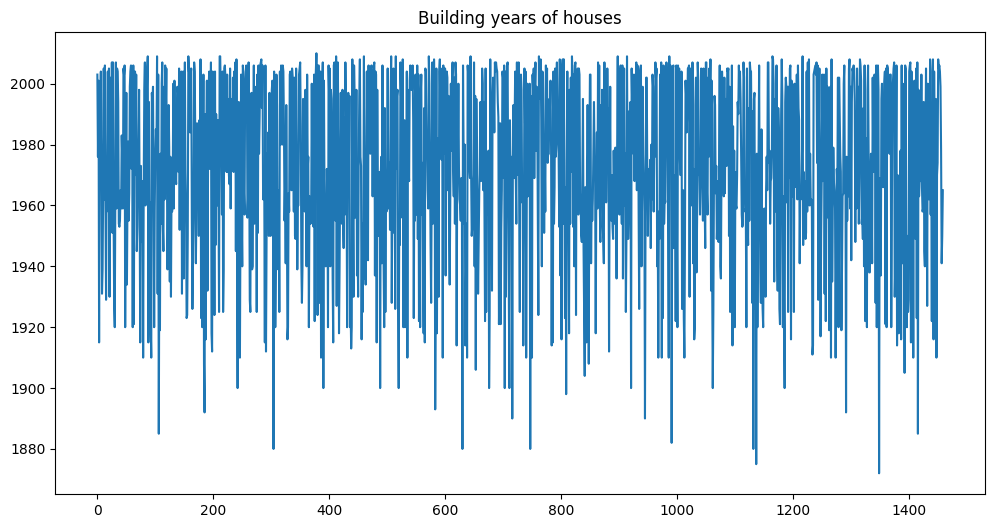

In [ ]:
fig, ax = plt.subplots(figsize = (12, 6))
year_built = list()
for year in train["YearBuilt"].values:
    year_built.append(year)
year_built = pd.Series(year_built)
year_built.plot(kind = "line").set_title("Building years of houses");

In [ ]:
#From here need to do
print("Basic descriptive statistics of the target variable - 'SalePrice': \n\n",
      train["SalePrice"].describe())

Basic descriptive statistics of the target variable - 'SalePrice': 

 count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64


<div style="border-radius:10px;
            border : black solid;
            background-color: 	#6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Target variable</center></h4>
    
● average of the target variable is 180921
    
● standard deviation of the target variable is 79442
    
● minimum of the target variable is 34900
    
● maximum of the target variable is 755000
    
● median of the target variable is 163000

In [ ]:
train["YearBuilt"].describe()

count    1460.000000
mean     1971.267808
std        30.202904
min      1872.000000
25%      1954.000000
50%      1973.000000
75%      2000.000000
max      2010.000000
Name: YearBuilt, dtype: float64

<div style="border-radius:10px;
            border : black solid;
            background-color: 	#6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Years built</center></h4>
    
● The oldest house has been built in 1872
    
● The newest house has been built in 2010

In [ ]:
print("Skewness: ", train["SalePrice"].skew())

Skewness:  1.8828757597682129



    
Positive skewness, because more weight is on the left side of the distribution

In [ ]:
print("Kurtosis: ", train["SalePrice"].kurt())

Kurtosis:  6.536281860064529


<div style="border-radius:10px;
            border : black solid;
            background-color: 	#6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Kurtosis grater than 3</center></h4>
    
It is leptokurtic. It will signify that it produces outliers rather than a normal distribution.

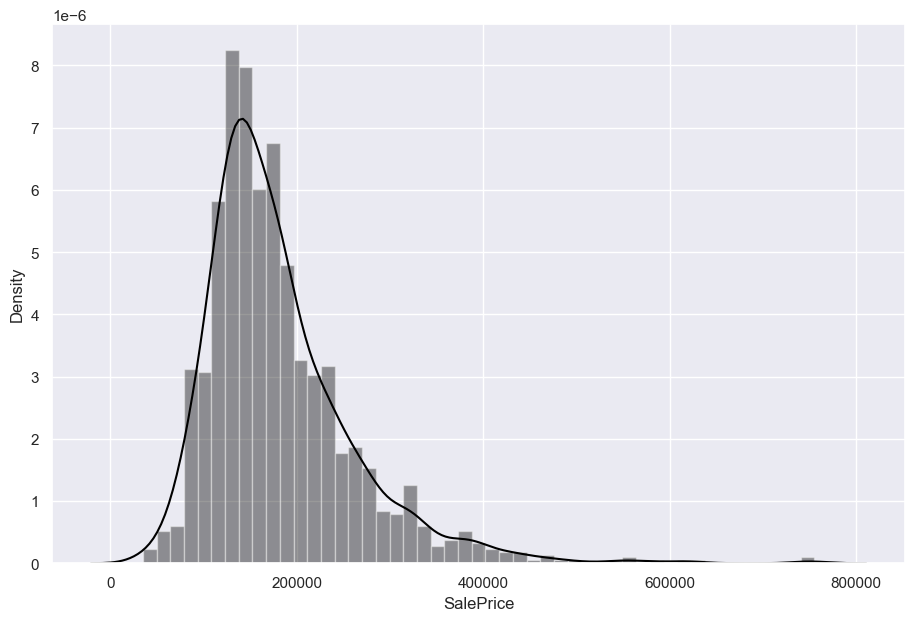

In [ ]:
sns.set(rc = {"figure.figsize" : (11, 7)})
sns.distplot(train["SalePrice"], color = "black");

<div style="border-radius:10px;
            border : black solid;
            background-color:#6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> The graph shows positive skewness</center></h4>
    
We see positive skewness from the graph above. As the graphs shows, more weight is on the left side of the distribution. We will fix it using 'norm' function and "log1p" function of numpy

In [ ]:
# we are fixing the variable distribution
train["SalePrice"] = np.log1p(train["SalePrice"])
train["SalePrice"].head(n = 10)

0    12.247699
1    12.109016
2    12.317171
3    11.849405
4    12.429220
5    11.870607
6    12.634606
7    12.206078
8    11.774528
9    11.678448
Name: SalePrice, dtype: float64

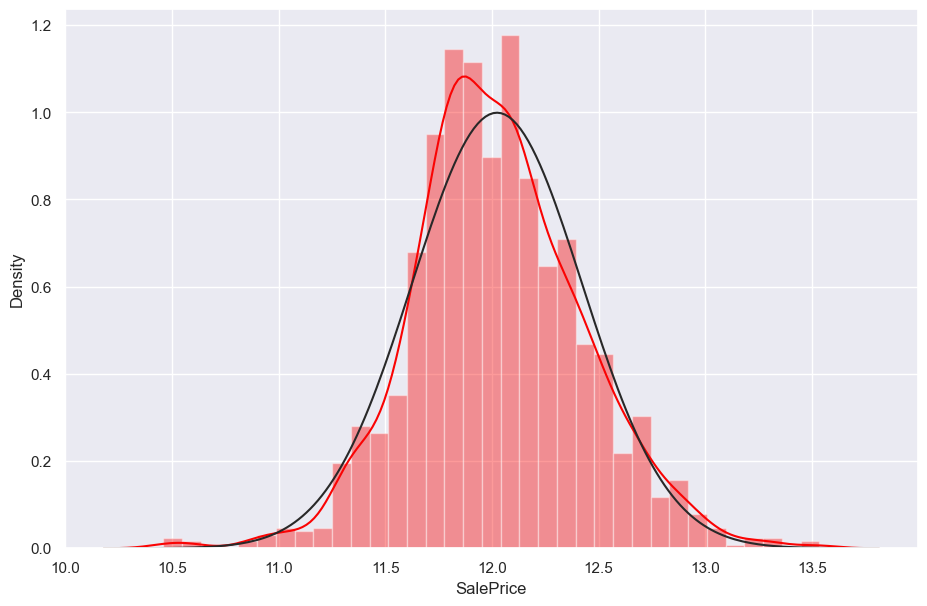

In [ ]:
# distribution of the fixed variable
sns.distplot(train["SalePrice"], fit = norm, color = "#FA0303");

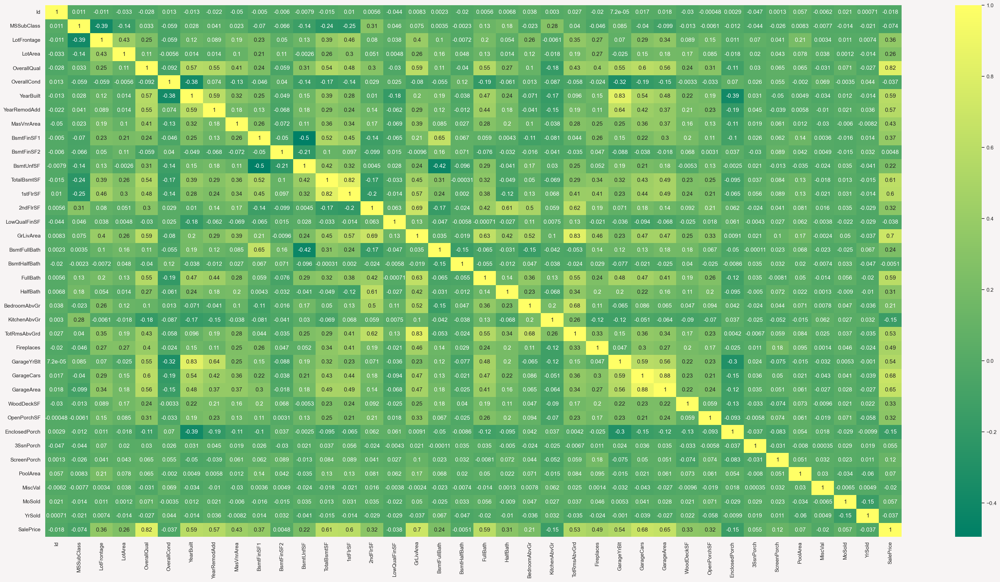

In [ ]:
# Filter out non-numeric columns from the DataFrame
numeric_train = train.select_dtypes(include=[np.number])

# Calculate the correlation matrix for numeric columns only
correlation_matrix = numeric_train.corr()

# Create the plot
plt.figure(figsize=[40, 20], facecolor="#F7F4F4")

# Plot the heatmap
sns.heatmap(correlation_matrix, annot=True, cmap="summer")
plt.show()

<div style="border-radius:10px;
            border : black solid;
            background-color: 	#6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Conclusion</center></h4>
    
From the heatmap above, we see positive and negative correlations between the variables. And this is what we do not want.

<div style="border-radius:10px;
            border : black solid;
            background-color:#EEFD00;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Correlation greater then 0.5 with 'SalePrice' variable</center></h4>
    
Here we will select variables that have correlation coefficient greater than 0.4 with 'SalePrice' variable.

In [ ]:
# Select only numeric columns for correlation
numeric_train = train.select_dtypes(include=[np.number])

# Compute correlation on the numeric columns
correlation_df = numeric_train.corr()

# Extract variables with high correlation to 'SalePrice'
high_correlation_variables = correlation_df.index[abs(correlation_df["SalePrice"]) > 0.4]
high_correlation_variables

Index(['OverallQual', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'TotalBsmtSF',
       '1stFlrSF', 'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageYrBlt', 'GarageCars', 'GarageArea', 'SalePrice'],
      dtype='object')

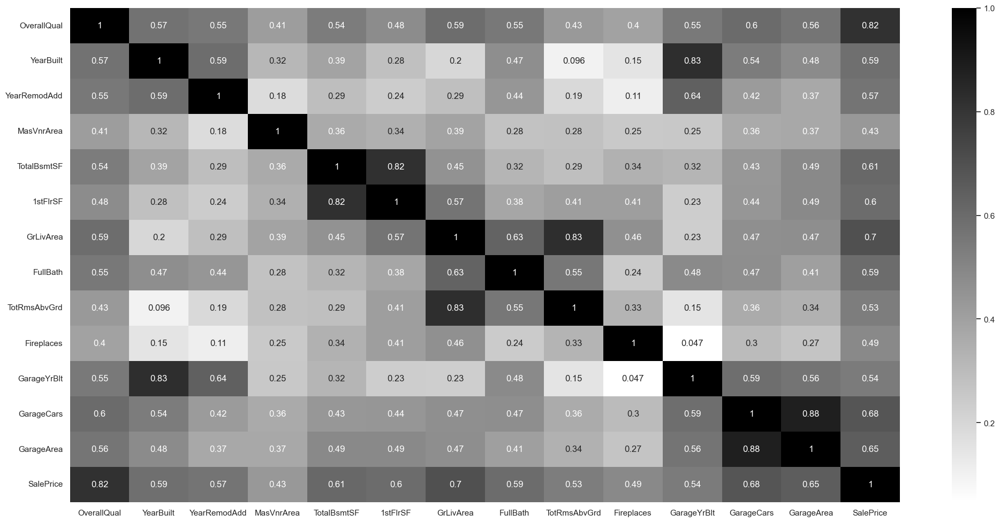

In [ ]:
plt.figure(figsize = (25, 12))
sns.heatmap(train[high_correlation_variables].corr(), annot = True, cmap = "binary");

In [ ]:
fig = px.imshow(train[high_correlation_variables])
fig.show()

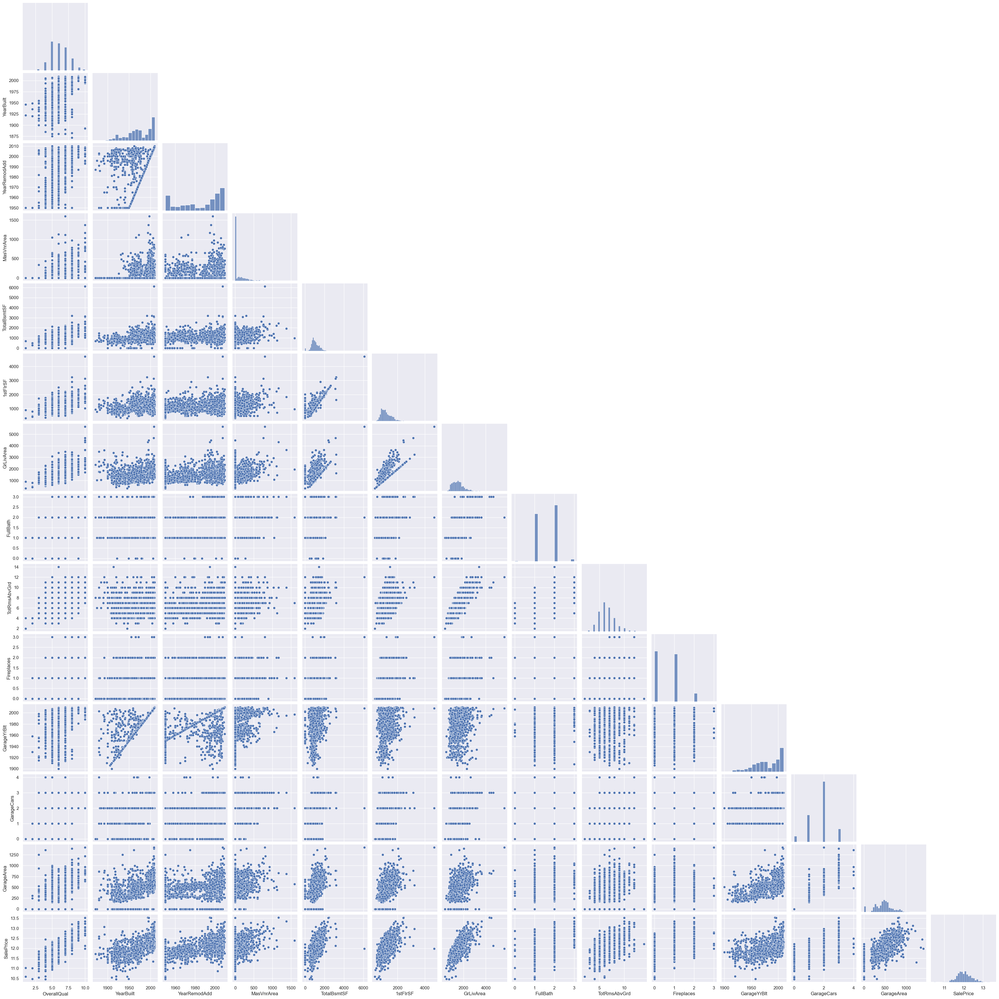

In [ ]:
sns.pairplot(train[high_correlation_variables], corner = True);

<div style="border-radius:10px;
            border : black solid;
            background-color: #6EF322;
            font-size:110%;
            text-align: left">
​
<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Feature selection </center></h4>
    
An interesting and important point is here. So, looking at the heat map, we will choose some of the variables that are correlated with each other and with the 'SalesPrice' variable. In this selection process, we have to keep one of the columns correlated with the other.
    
We will select "SalePrice", "OverallQual", "GrLivArea", "GarageCars", "TotalBsmtSF", "FullBath", "YearBuilt" variables. Because correlation coefficient of these variables with 'SalePrice' variable is high, BUT correlation coefficient between each other is very low

In [ ]:
train[high_correlation_variables].corr()

,OverallQual,YearBuilt,YearRemodAdd,MasVnrArea,TotalBsmtSF,1stFlrSF,GrLivArea,FullBath,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,SalePrice
OverallQual,1.000000,0.572323,0.550684,0.411876,0.537808,0.476224,0.593007,0.550600,0.427452,0.396765,0.547766,0.600671,0.562022,0.817185
YearBuilt,0.572323,1.000000,0.592855,0.315707,0.391452,0.281986,0.199010,0.468271,0.095589,0.147716,0.825667,0.537850,0.478954,0.586570
YearRemodAdd,0.550684,0.592855,1.000000,0.179618,0.291066,0.240379,0.287389,0.439046,0.191740,0.112581,0.642277,0.420622,0.371600,0.565608
MasVnrArea,0.411876,0.315707,0.179618,1.000000,0.363936,0.344501,0.390857,0.276833,0.280682,0.249070,0.252691,0.364204,0.373066,0.430809
TotalBsmtSF,0.537808,0.391452,0.291066,0.363936,1.000000,0.819530,0.454868,0.323722,0.285573,0.339519,0.322445,0.434585,0.486665,0.612134
1stFlrSF,0.476224,0.281986,0.240379,0.344501,0.819530,1.000000,0.566024,0.380637,0.409516,0.410531,0.233449,0.439317,0.489782,0.596981
GrLivArea,0.593007,0.199010,0.287389,0.390857,0.454868,0.566024,1.000000,0.630012,0.825489,0.461679,0.231197,0.467247,0.468997,0.700927
FullBath,0.550600,0.468271,0.439046,0.276833,0.323722,0.380637,0.630012,1.000000,0.554784,0.243671,0.484557,0.469672,0.405656,0.594771
TotRmsAbvGrd,0.427452,0.095589,0.191740,0.280682,0.285573,0.409516,0.825489,0.554784,1.000000,0.326114,0.148112,0.362289,0.337822,0.534422
Fireplaces,0.396765,0.147716,0.112581,0.249070,0.339519,0.410531,0.461679,0.243671,0.326114,1.000000,0.046822,0.300789,0.269141,0.489450


<div style="border-radius:10px;
            border : black solid;
            background-color: #6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> High correlation between some variables </center></h4>
    
An important point is here. So, looking at the correlation table we will see that there is high correlation between some of the variables. These are:

1. "GarageArea" and "GarageCars"
2. "1stFlrSF" and "TotalBsmtSF"
3. "TotRmsAbvGrd" and "GrLivArea"
4. "GarageYearbuilt" and "YearBuilt"
     
    
We will drop "GarageArea", "1stFlrSF", "TotRmsAbvGrd", "GarageYrBlt" variables later

In [ ]:
# variables that have highest correlation with target variable

variables = ["OverallQual", "GrLivArea", "GarageCars", "TotalBsmtSF", "FullBath", "YearBuilt"]
for var in variables:
    print("Correlation coefficient:", train["SalePrice"].corr(train[var]))

Correlation coefficient: 0.8171846144867667
Correlation coefficient: 0.700926987142715
Correlation coefficient: 0.6806248726581897
Correlation coefficient: 0.6121342283262258
Correlation coefficient: 0.5947706649972515
Correlation coefficient: 0.586570192789716


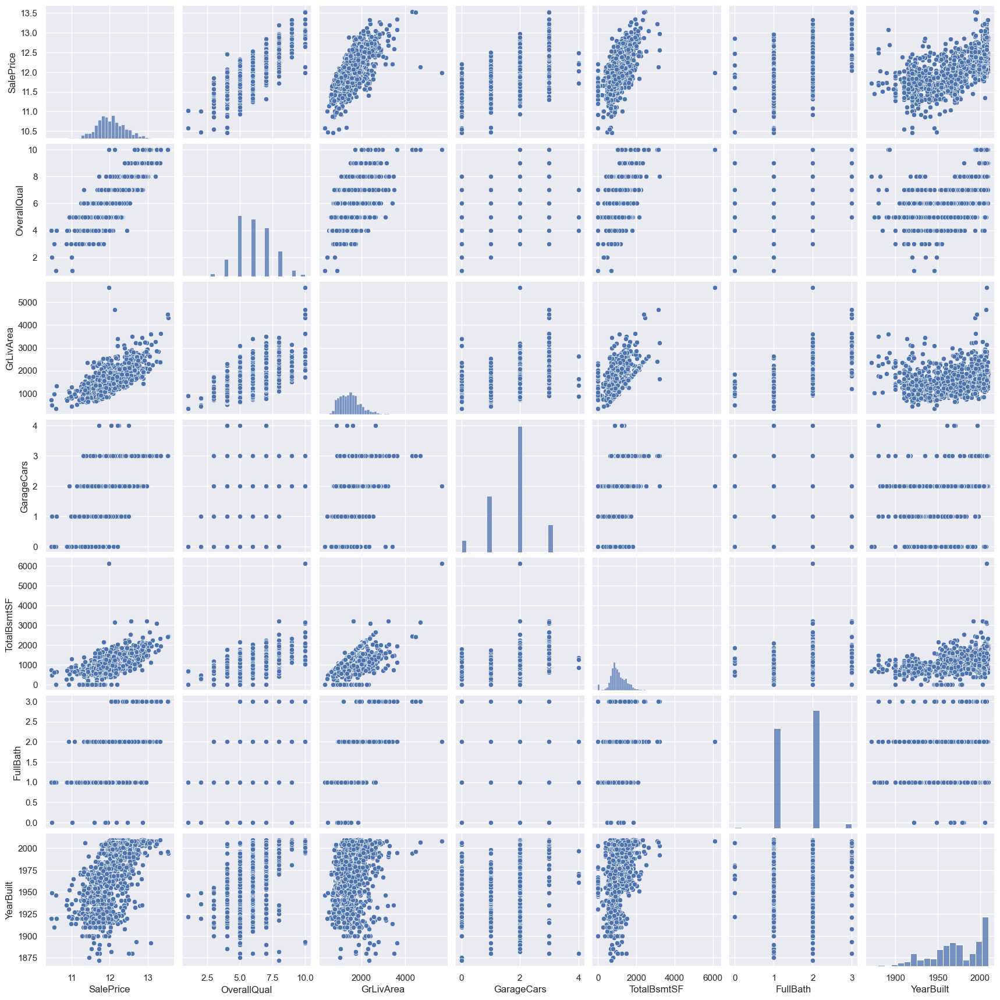

In [ ]:
variables = ["SalePrice", "OverallQual", "GrLivArea", "GarageCars", "TotalBsmtSF", "FullBath", "YearBuilt"]
sns.pairplot(train[variables]);

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#808000; font-family:arial;color:#FFFFFF;font-size:150%;text-align:center;border-radius:55px 1px;">DROPPING OUTLIERS</p>

In [ ]:
def outlier_detection_train(df, n, columns):
    rows = []
    will_drop_train = []
    for col in columns:
        Q1 = np.nanpercentile(df[col], 25)
        Q3 = np.nanpercentile(df[col], 75)
        IQR = Q3 - Q1
        outlier_point = 1.5 * IQR
        rows.extend(df[(df[col] < Q1 - outlier_point)|(df[col] > Q3 + outlier_point)].index)
    for r, c in Counter(rows).items():
        if c >= n: will_drop_train.append(r)
    return will_drop_train

will_drop_train = outlier_detection_train(train, 5, train.select_dtypes(["float", "int"]).columns)
train.drop(will_drop_train, inplace = True, axis = 0)

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#808000; font-family:arial;color:#FFFFFF;font-size:150%;text-align:center;border-radius:55px 1px;">Imputing null values</p>

In [ ]:
# define target variable

y_train = train["SalePrice"]

In [ ]:
# combine train and test data for convenience

train_and_test_df = pd.concat([train, test], axis = 0)
train_and_test_df = train_and_test_df.drop(["Id", "SalePrice"], axis = 1)

In [ ]:
train_and_test_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,NaN,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216.0,Unf,0.0,540.0,756.0,GasA,Gd,Y,SBrkr,961,756,0,1717,1.0,0.0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3.0,642.0,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655.0,Unf,0.0,490.0,1145.0,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1.0,0.0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3.0,836.0,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1454,160,RM,21.0,1936,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,2Story,4,7,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Unf,0.0,Unf,0.0,546.0,546.0,GasA,Gd,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,6,2006,WD,Normal
1455,160,RM,21.0,1894,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,TwnhsE,2Story,4,5,1970,1970,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,252.0,Unf,0.0,294.0,546.0,GasA,TA,Y,SBrkr,546,546,0,1092,0.0,0.0,1,1,3,1,TA,6,Typ,0,NaN,CarPort,1970.0,Unf,1.0,286.0,TA,TA,Y,0,24,0,0,0,0,NaN,NaN,NaN,0,4,2006,WD,Abnorml
1456,20,RL,160.0,20000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1Story,5,7,1960,1996,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,ALQ,1224.0,Unf,0.0,0.0,1224.0,GasA,Ex,Y,SBrkr,1224,0,0,1224,1.0,0.0,1,0,4,1,TA,7,Typ,1,TA,Detchd,1960.0,Unf,2.0,576.0,TA,TA,Y,474,0,0,0,0,0,NaN,NaN,NaN,0,9,2006,WD,Abnorml
1457,85,RL,62.0,10441,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,SFoyer,5,5,1992,1992,Gable,CompShg,HdBoard,Wd Shng,NaN,0.0,TA,TA,PConc,Gd,TA,Av,GLQ,337.0,Unf,0.0,

In [ ]:
# create dataframes consist of total number and percent of missing data

number_of_missing_df = train_and_test_df.isnull().sum().sort_values(ascending = False)
percent_of_missing_df = ((train_and_test_df.isnull().sum() / train_and_test_df.isnull().count())*100).sort_values(ascending = False)

In [ ]:
# combine the dataframes and print

missing_df = pd.concat([number_of_missing_df,
                        percent_of_missing_df],
                        keys = ["total number of missing data", 'total percent of missing data'],
                        axis = 1)


print(missing_df.head(20))

              total number of missing data  total percent of missing data
PoolQC                                2880                      99.792100
MiscFeature                           2786                      96.534997
Alley                                 2690                      93.208593
Fence                                 2322                      80.457380
MasVnrType                            1750                      60.637561
FireplaceQu                           1415                      49.029799
LotFrontage                            476                      16.493416
GarageYrBlt                            155                       5.370755
GarageFinish                           155                       5.370755
GarageQual                             155                       5.370755
GarageCond                             155                       5.370755
GarageType                             153                       5.301455
BsmtExposure                          

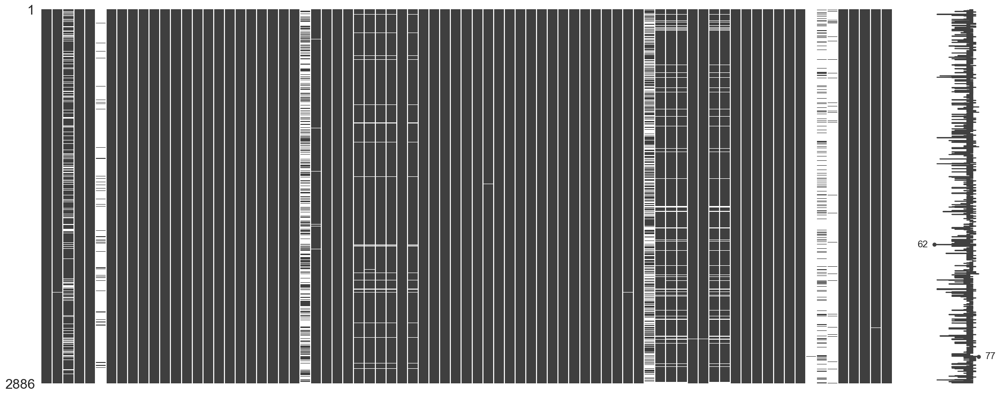

In [ ]:
#visualize missing values with matrix
msno.matrix(train_and_test_df);

<div style="border-radius:10px;
            border : black solid;
            background-color:#EEFD00;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Drop unnecessary variables</center></h4>
    
Here we will drop some variables. Because there are many null values of some of these variables. To keep and use these variables in our model will slow performance of the model and do not give any improvement. So lets do this.

In [ ]:
train_and_test_df = train_and_test_df.drop((missing_df[missing_df["total number of missing data"] > 100]).index, axis = 1)
train_and_test_df.isnull().sum().sort_values(ascending = False)

BsmtCond         81
BsmtExposure     81
BsmtQual         80
BsmtFinType2     79
BsmtFinType1     78
                 ..
Foundation        0
Heating           0
HeatingQC         0
CentralAir        0
SaleCondition     0
Length: 67, dtype: int64

<div style="border-radius:10px;
            border : black solid;
            background-color:#EEFD00;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Filling null values</center></h4>
    
We will fill null values of numeric variables with the median of that variable.
We will fill null values of categoric variables with the most frequent value of that variable.

In [ ]:
numeric_data = [column for column in train_and_test_df.select_dtypes(["int", "float"])]
categoric_data = [column for column in train_and_test_df.select_dtypes(exclude = ["int", "float"])]

for col in numeric_data:
    train_and_test_df[col].fillna(train_and_test_df[col].median(), inplace = True)

for col in categoric_data:
    train_and_test_df[col].fillna(train_and_test_df[col].value_counts().index[0], inplace = True)

In [ ]:
#ckeck whether there are missing values
train_and_test_df.isnull().sum().sum()

0

<div style="border-radius:10px;
            border : black solid;
            background-color: #6EF322;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Not null</center></h4>
    
As it can be seen there is not any null values in the dataset. We filled them.

<div style="border-radius:10px;
            border : black solid;
            background-color:#EEFD00;
            font-size:110%;
            text-align: left">

<h4 style='; border:0; border-radius: 10px; font-weight: bold; color:black'><center> Other skewed distributions</center></h4>
    
In this section our goal is to fix other skewed numeric variables.

In [ ]:
# we select numeric variables of the dataset
numeric_data = [column for column in train_and_test_df.select_dtypes(["int", "float"])]

# we check skew degree of that variables
vars_skewed = train_and_test_df[numeric_data].apply(lambda x: skew(x)).sort_values()

In [ ]:
# we fix skew with 'log1p' function of numpy

for var in vars_skewed.index:
    train_and_test_df[var] = np.log1p(train_and_test_df[var])

In [ ]:
train_and_test_df = train_and_test_df.drop(["GarageArea", "1stFlrSF", "TotRmsAbvGrd"],
                                          axis = 1)

In [ ]:
train_and_test_df

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,...,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,4.110874,9.042040,2.079442,1.791759,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,6.751101,0.0,7.444833,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.000000,1.098612,0.000000,4.127134,0.000000,0.0,0.0,0.0,0.000000,1.098612,7.605392,False,False,False,True,False,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
1,3.044522,9.169623,1.945910,2.197225,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,0.000000,0.0,7.141245,0.000000,0.693147,1.098612,0.000000,1.386294,0.693147,0.693147,1.098612,5.700444,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.791759,7.604894,False,False,False,True,False,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
2,4.110874,9.328212,2.079442,1.791759,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,6.765039,0.0,7.488294,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.693147,1.098612,0.000000,3.761200,0.000000,0.0,0.0,0.0,0.000000,2.302585,7.605392,False,False,False,True,False,False,True,True,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
3,4.262680,9.164401,2.079442,1.791759,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,6.629363,0.0,7.448916,0.693147,0.000000,0.693147,0.000000,1.386294,0.693147,0.693147,1.386294,0.000000,3.583519,5.609472,0.0,0.0,0.0,0.000000,1.098612,7.604396,False,False,False,True,False,False,True,True,False,False,...,False,False,True,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False
4,4.110874,9.565284,2.197225,1.791759,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,6.960348,0.0,7.695758,0.693147,0.000000,1.098612,0.693147,1.609438,0.693147,0.693147,1.386294,5.262690,4.442651,0.000000,0.0,0.0,0.0,0.000000,2.564949,7.605392,False,False,False,True,False,False,True,True,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
train_and_test_df = pd.get_dummies(train_and_test_df, drop_first = True,dtype=int)

In [ ]:
train_and_test_df.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,...,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,4.110874,9.042040,2.079442,1.791759,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,6.751101,0.0,7.444833,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.000000,1.098612,0.000000,4.127134,0.000000,0.0,0.0,0.0,0.0,1.098612,7.605392,False,False,False,True,False,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
1,3.044522,9.169623,1.945910,2.197225,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,0.000000,0.0,7.141245,0.000000,0.693147,1.098612,0.000000,1.386294,0.693147,0.693147,1.098612,5.700444,0.000000,0.000000,0.0,0.0,0.0,0.0,1.791759,7.604894,False,False,False,True,False,False,True,False,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,False,True,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
2,4.110874,9.328212,2.079442,1.791759,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,6.765039,0.0,7.488294,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.693147,1.098612,0.000000,3.761200,0.000000,0.0,0.0,0.0,0.0,2.302585,7.605392,False,False,False,True,False,False,True,True,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False
3,4.262680,9.164401,2.079442,1.791759,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,6.629363,0.0,7.448916,0.693147,0.000000,0.693147,0.000000,1.386294,0.693147,0.693147,1.386294,0.000000,3.583519,5.609472,0.0,0.0,0.0,0.0,1.098612,7.604396,False,False,False,True,False,False,True,True,False,False,...,False,False,True,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,True,False,False,False,False,False
4,4.110874,9.565284,2.197225,1.791759,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,6.960348,0.0,7.695758,0.693147,0.000000,1.098612,0.693147,1.609438,0.693147,0.693147,1.386294,5.262690,4.442651,0.000000,0.0,0.0,0.0,0.0,2.564949,7.605392,False,False,False,True,False,False,True,True,False,False,...,True,False,False,False,False,False,True,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,True,False,False,True,False,False,False,False,False,False,False,False,True,False,False,False,False,True,False


In [ ]:
#Since pd.get_dummies resulted in true and false, I am running a code to convert those in 0 and 1
for col in train_and_test_df.columns:
    if train_and_test_df[col].dtype == 'bool':
        train_and_test_df[col] = train_and_test_df[col].astype(int)

In [ ]:
train_and_test_df.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,...,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,4.110874,9.042040,2.079442,1.791759,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,6.751101,0.0,7.444833,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.000000,1.098612,0.000000,4.127134,0.000000,0.0,0.0,0.0,0.0,1.098612,7.605392,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,3.044522,9.169623,1.945910,2.197225,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,0.000000,0.0,7.141245,0.000000,0.693147,1.098612,0.000000,1.386294,0.693147,0.693147,1.098612,5.700444,0.000000,0.000000,0.0,0.0,0.0,0.0,1.791759,7.604894,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,4.110874,9.328212,2.079442,1.791759,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,6.765039,0.0,7.488294,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.693147,1.098612,0.000000,3.761200,0.000000,0.0,0.0,0.0,0.0,2.302585,7.605392,0,0,0,1,0,0,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,4.262680,9.164401,2.079442,1.791759,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,6.629363,0.0,7.448916,0.693147,0.000000,0.693147,0.000000,1.386294,0.693147,0.693147,1.386294,0.000000,3.583519,5.609472,0.0,0.0,0.0,0.0,1.098612,7.604396,0,0,0,1,0,0,1,1,0,0,...,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
4,4.110874,9.565284,2.197225,1.791759,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,6.960348,0.0,7.695758,0.693147,0.000000,1.098612,0.693147,1.609438,0.693147,0.693147,1.386294,5.262690,4.442651,0.000000,0.0,0.0,0.0,0.0,2.564949,7.605392,0,0,0,1,0,0,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [ ]:
x_train = train_and_test_df[:len(train)]
x_test = train_and_test_df[len(train):]

In [ ]:
x_train.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,...,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,4.110874,9.042040,2.079442,1.791759,7.602900,7.602900,5.283204,6.561031,0.0,5.017280,6.753438,6.751101,0.0,7.444833,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.000000,1.098612,0.000000,4.127134,0.000000,0.0,0.0,0.0,0.0,1.098612,7.605392,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,3.044522,9.169623,1.945910,2.197225,7.589336,7.589336,0.000000,6.886532,0.0,5.652489,7.141245,0.000000,0.0,7.141245,0.000000,0.693147,1.098612,0.000000,1.386294,0.693147,0.693147,1.098612,5.700444,0.000000,0.000000,0.0,0.0,0.0,0.0,1.791759,7.604894,0,0,0,1,0,0,1,0,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,4.110874,9.328212,2.079442,1.791759,7.601902,7.602401,5.093750,6.188264,0.0,6.075346,6.825460,6.765039,0.0,7.488294,0.693147,0.000000,1.098612,0.693147,1.386294,0.693147,0.693147,1.098612,0.000000,3.761200,0.000000,0.0,0.0,0.0,0.0,2.302585,7.605392,0,0,0,1,0,0,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,4.262680,9.164401,2.079442,1.791759,7.557995,7.586296,0.000000,5.379897,0.0,6.293419,6.629363,6.629363,0.0,7.448916,0.693147,0.000000,0.693147,0.000000,1.386294,0.693147,0.693147,1.386294,0.000000,3.583519,5.609472,0.0,0.0,0.0,0.0,1.098612,7.604396,0,0,0,1,0,0,1,1,0,0,...,0,0,1,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0
4,4.110874,9.565284,2.197225,1.791759,7.601402,7.601402,5.860786,6.486161,0.0,6.196444,7.044033,6.960348,0.0,7.695758,0.693147,0.000000,1.098612,0.693147,1.609438,0.693147,0.693147,1.386294,5.262690,4.442651,0.000000,0.0,0.0,0.0,0.0,2.564949,7.605392,0,0,0,1,0,0,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [ ]:
x_train.shape

(1427, 240)

In [ ]:
y_train.shape

(1427,)

In [ ]:
x_test.head()

,MSSubClass,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,Fireplaces,GarageCars,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,LotShape_IR1,LotShape_IR2,LotShape_IR3,...,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,PavedDrive_N,PavedDrive_P,PavedDrive_Y,SaleType_COD,SaleType_CWD,SaleType_Con,SaleType_ConLD,SaleType_ConLI,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,3.044522,9.360741,1.791759,1.945910,7.581720,7.581720,0.000000,6.150603,4.976734,5.602119,6.783325,0.000000,0.0,6.799056,0.0,0.0,0.693147,0.000000,1.098612,0.693147,0.000000,0.693147,4.948760,0.000000,0.0,0.0,4.795791,0.0,0.000000,1.945910,7.606387,0,0,1,0,0,0,1,0,0,0,...,0,0,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
1,3.044522,9.565775,1.945910,1.945910,7.580189,7.580189,4.691348,6.828712,0.000000,6.008813,7.192934,0.000000,0.0,7.192934,0.0,0.0,0.693147,0.693147,1.386294,0.693147,0.000000,0.693147,5.976351,3.610918,0.0,0.0,0.000000,0.0,9.433564,1.945910,7.606387,0,0,0,1,0,0,1,1,0,0,...,0,0,0,0,1,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
2,4.110874,9.534668,1.791759,1.791759,7.599902,7.600402,0.000000,6.674561,0.000000,4.927254,6.834109,6.553933,0.0,7.396335,0.0,0.0,1.098612,0.693147,1.386294,0.693147,0.693147,1.098612,5.361292,3.555348,0.0,0.0,0.000000,0.0,0.000000,1.386294,7.606387,0,0,0,1,0,0,1,1,0,0,...,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
3,4.110874,9.208238,1.945910,1.945910,7.600402,7.600402,3.044522,6.401917,0.000000,5.783825,6.831954,6.520621,0.0,7.380879,0.0,0.0,1.098612,0.693147,1.386294,0.693147,0.693147,1.098612,5.888878,3.610918,0.0,0.0,0.000000,0.0,0.000000,1.945910,7.606387,0,0,0,1,0,0,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
4,4.795791,8.518392,2.197225,1.791759,7.597396,7.597396,0.000000,5.575949,0.000000,6.925595,7.155396,0.000000,0.0,7.155396,0.0,0.0,1.098612,0.000000,1.098612,0.693147,0.000000,1.098612,0.000000,4.418841,0.0,0.0,4.976734,0.0,0.000000,0.693147,7.606387,0,0,0,1,0,0,1,1,0,0,...,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0


In [ ]:
x_test.shape

(1459, 240)

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#808000; font-family:arial;color:#FFFFFF;font-size:150%;text-align:center;border-radius:55px 1px;">MACHINE LEARNING MODELS</p>

#### Cross validation metrics and setup kfold

In [ ]:
k_fold = KFold(n_splits = 15, random_state = 11, shuffle = True)

## 1. Build machine learning models
## 2. Get cross validation scores of the models
## 3. Stack up the models

In [ ]:
def cv_rmse(model, X = x_train):
    rmse = np.sqrt(-cross_val_score(model, x_train, y_train, scoring = "neg_mean_squared_error", cv = k_fold))
    return rmse


def rmsle(y, y_pred):
    y_pred_adjusted = np.where(y_pred < 0, 0, y_pred)  # Replace negative predictions with 0
    return np.sqrt(mean_squared_log_error(y, y_pred_adjusted))

#### XGBoost

In [ ]:
xgb = make_pipeline(RobustScaler(),
                    XGBRegressor(colsample_bytree = 0.5, n_estimators = 6000,
                                 max_depth = 4, learning_rate = 0.01, gamma = 0.45,
                                 subsample = 0.5, random_state = 11, reg_alpha = 0.00006,
                                 reg_lambda = None, nthread = -1))

In [ ]:
# get CV score of the xgb model
score = cv_rmse(xgb)
print("Xgboost model's cross validation score: ", score.mean())

Xgboost model's cross validation score:  0.12602127412909991


#### Light GBM

In [ ]:
lgbm = make_pipeline(RobustScaler(),
                     LGBMRegressor(num_leaves = 6, bagging_fraction = 0.7,
                                   bagging_freq = 4, min_sum_hessian_in_leaf = 11,
                                   learning_rate = 0.01, n_estimators = 7500, max_bin = 200,
                                   random_state = 11))

#### Ridge

In [ ]:
ridge = make_pipeline(RobustScaler(),
                      RidgeCV(alphas = [1e-10, 1e-8, 1e-5, 1e-2, 9e-4,
                                                        5e-4, 3e-4, 1e-4, 1e-3, 1e-2, 0.1,
                                                        0.3, 0.6, 1, 3, 5, 7, 14, 18, 25, 30,
                                                        45, 50, 70, 90], cv = k_fold))

In [ ]:
# get CV score of the ridge model
score = cv_rmse(ridge)
print("Ridge model's cross validation score: ", score.mean())

Ridge model's cross validation score:  0.11068340275992217


#### Lasso

In [ ]:
lasso = make_pipeline(RobustScaler(),
                      LassoCV(alphas = [1e-10, 1e-8, 1e-5, 1e-2, 9e-4,
                                                        5e-4, 3e-4, 1e-4, 1e-3, 1e-2, 0.1,
                                                        0.3, 0.6, 1, 3, 5, 7, 14, 18, 25, 30,
                                                        45, 50, 70, 90], n_jobs = -1, cv = k_fold))

In [ ]:
# get CV score of the lasso model
score = cv_rmse(lasso)
print("Lasso model's cross validation score: ", score.mean())

Lasso model's cross validation score:  0.1092055649644798


#### Gradient boosting machines

In [ ]:
gbr = make_pipeline(RobustScaler(),
                    GradientBoostingRegressor(n_estimators = 7000, learning_rate = 0.01,
                                              max_depth = 5, min_samples_split = 12, min_samples_leaf = 16,
                                              loss = "huber", max_features = "sqrt", random_state = 11))

In [ ]:
# get CV score of the gbr model
score = cv_rmse(gbr)
print("Gradient boosting model's cross validation score: ", score.mean())

Gradient boosting model's cross validation score:  0.11052621098488416


#### Random forest

In [ ]:
rf = make_pipeline(RobustScaler(),
                   RandomForestRegressor(n_estimators = 2500, max_depth = 15,
                                         min_samples_split = 6, min_samples_leaf = 6,
                                         random_state = 11))

In [ ]:
# get CV score of the rf model
score = cv_rmse(rf)
print("Random forest model's cross validation score: ", score.mean())

Random forest model's cross validation score:  0.13595601455048312


#### Support Vector Machines

In [ ]:
svr = make_pipeline(RobustScaler(), SVR(C = 30, gamma = 0.0002, epsilon = 0.009))

In [ ]:
# get CV score of the svr model
score = cv_rmse(svr)
print("Support vector machines model's cross validation score: ", score.mean())

Support vector machines model's cross validation score:  0.10852514762107246


#### Stack up the models

In [ ]:
stacked = StackingCVRegressor(regressors = (xgb, lgbm, ridge, svr, lasso, gbr, rf),
                              meta_regressor = xgb, use_features_in_secondary = True)

## 1. Fit the models on full train data
## 2. RMSLE scores of the models on full train data

In [ ]:
gbr_model = gbr.fit(x_train, y_train)

#RMSLE score of the gbr model on full train data
gbr_score = rmsle(y_train, gbr_model.predict(x_train))
print("RMSLE score of xgboost model on full data:", gbr_score)

svr_model = svr.fit(x_train, y_train)

#RMSLE score of the svr model on full train data
svr_score = rmsle(y_train, svr_model.predict(x_train))
print("RMSLE score of svr model on full data:", svr_score)

xgb_model = xgb.fit(x_train, y_train)

#RMSLE score of the xgb model on full train data
xgb_score = rmsle(y_train, xgb_model.predict(x_train))
print("RMSLE score of xgboost model on full data:", xgb_score)

lgbm_model = lgbm.fit(x_train, y_train)

#RMSLE score of the lgbm model on full train data
lgbm_score = rmsle(y_train, lgbm_model.predict(x_train))
print("RMSLE score of lgbm model on full data:", lgbm_score)

ridge_model = ridge.fit(x_train, y_train)

#RMSLE score of the ridge model on full train data
ridge_score = rmsle(y_train, ridge_model.predict(x_train))
print("RMSLE score of ridge model on full data:", ridge_score)

lasso_model = lasso.fit(x_train, y_train)

#RMSLE score of the lasso model on full train data
lasso_score = rmsle(y_train, lasso_model.predict(x_train))
print("RMSLE score of lasso model on full data:", lasso_score)

rf_model = rf.fit(x_train, y_train)

#RMSLE score of the rf model on full train data
rf_score = rmsle(y_train, rf_model.predict(x_train))
print("RMSLE score of random forest model on full data:", rf_score)

stacked_model = stacked.fit(np.array(x_train), np.array(y_train))

#RMSLE score of the stacked model on full train data
stacked_score = rmsle(y_train, stacked_model.predict(x_train))
print("RMSLE score of stacked models on full data:", stacked_score)

RMSLE score of xgboost model on full data: 0.004698402325593073
RMSLE score of svr model on full data: 0.007768385926839527
RMSLE score of xgboost model on full data: 0.00861591892540214
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0

[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#808000; font-family:arial;color:#FFFFFF;font-size:150%;text-align:center;border-radius:55px 1px;">Make prediction on the test dataset</p>

In [ ]:
y_pred = np.floor(np.expm1(stacked_model.predict(x_test)))
y_pred[0:5]

[LightGBM] [Warning] min_sum_hessian_in_leaf is set=11, min_child_weight=0.001 will be ignored. Current value: min_sum_hessian_in_leaf=11
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4


array([119075., 160848., 180320., 191866., 184564.], dtype=float32)

<a id='top'></a>
<div class="list-group" id="list-tab" role="tablist">
<p style="background-color:#808000; font-family:arial;color:#FFFFFF;font-size:150%;text-align:center;border-radius:55px 1px;">Create Output file</p>

In [ ]:
output= pd.DataFrame()
output["Id"] = test["Id"]
output["SalePrice"] = y_pred
output

,Id,SalePrice
0,1461,119075.0
1,1462,160848.0
2,1463,180320.0
3,1464,191866.0
4,1465,184564.0
...,...,...
1454,2915,91883.0
1455,2916,90535.0
1456,2917,165314.0
1457,2918,122798.0
